This notebook is used for using [RCTD](https://github.com/dmcable/spacexr) tool to integrate scRNAseq data with ST data. It follows the tutorial given for the tool on [this page](https://www.bioconductor.org/packages/release/bioc/vignettes/spacexr/inst/doc/rctd-tutorial.html#introduction), as well as some additional QC steps.

This script uses cell major types with absolute threshold idea for spot annotation.

## Installation

In [1]:
if (!require("BiocManager", quietly = TRUE))
    install.packages("BiocManager")
BiocManager::install("spacexr") 

if (!require("BiocManager", quietly = TRUE))
    install.packages("BiocManager")
BiocManager::install("Matrix")

if (!require("BiocManager", quietly = TRUE))
    install.packages("BiocManager")
BiocManager::install("RCTD")

'getOption("repos")' replaces Bioconductor standard repositories, see
'help("repositories", package = "BiocManager")' for details.
Replacement repositories:
    CRAN: https://cloud.r-project.org

Bioconductor version 3.21 (BiocManager 1.30.26), R 4.5.0 (2025-04-11)

Warning message:
“package(s) not installed when version(s) same as or greater than current; use
  `force = TRUE` to re-install: 'spacexr'”
Installation paths not writeable, unable to update packages
  path: /usr/lib/R/library
  packages:
    lattice
  path: /usr/lib/R/site-library
  packages:
    BiocGenerics, coda, jsonlite, Rcpp, RcppArmadillo, rjags, sp

Old packages: 'anytime', 'BiocFileCache', 'broom', 'ComplexHeatmap', 'Deriv',
  'future', 'GenomeInfoDb', 'ggfun', 'httr2', 'parallelly', 'psych',
  'restfulr', 'reticulate', 'rgl', 'RSQLite', 'RUnit', 'scatterpie',
  'SparseArray', 'spatstat.explore', 'spatstat.model', 'spsComps', 'terra',
  'waldo'

'getOption("repos")' replaces Bioconductor standard repositories, see


In [2]:
library(spacexr)
library(Matrix)


## Data Preprocessing

## Reference scRNAseq Data

Before running RCTD, we must first load in:

* an annotated reference dataset, which is used to learn cell type profiles.

* a spatial transcriptomics dataset, which contains pixels for deconvolution.
 


### Step 2: Building a reference dataset for RCTD in R

The reference data should be stored in a SummarizedExperiment object with:

Required components:

**assay**: A matrix (or dgCMatrix) of gene expression counts, with genes as rows and cells as columns. Row names should be unique gene names, and column names should be unique cell barcodes. Counts should be untransformed integers.

**colData**: A factor column containing cell type annotations for each cell in the reference. The column name is assumed to be “cell_type”, but another name may be specified using the cell_type_col parameter in createRctd.

Optional components:

**colData**: A numeric column named nUMI, containing total UMI counts for each cell. If not provided, nUMI will be calculated as the column sums of the counts matrix.
In practice, your reference could be an annotated dataset from:

* Single-nucleus RNA sequencing (snRNA-seq)

* Single-cell RNA sequencing (scRNA-seq)

* Cell type-specific bulk RNA sequencing


In [3]:
library(Matrix)

refdir <- "/disk2/user/hilpek/project_root/scRNAseq/input2"

# counts (DGE matrix)
counts <- read.csv(file.path(refdir, "dge.csv"), row.names = 1)
counts <- as(as.matrix(counts), "dgCMatrix")  # sparse format for RCTD

# metadata
meta_data <- read.csv(file.path(refdir, "meta_data.csv"))
cell_types <- factor(meta_data$cluster)
names(cell_types) <- meta_data$barcode

nUMI <- meta_data$nUMI
names(nUMI) <- meta_data$barcode

# Create reference object
reference <- Reference(counts = counts, cell_types = cell_types, nUMI = nUMI)


In [4]:
## Examine reference object 
print(dim(reference@counts)) #observe Digital Gene Expression matrix

table(reference@cell_types) #number of occurences for each cell type

## Save RDS object
saveRDS(reference, file.path(refdir,'SCRef.rds'))

[1] 29733 33790



                B cells Memory                  B cells Naive 
                           566                              4 
         CAFs MSC iCAF-like s1          CAFs MSC iCAF-like s2 
                          1059                            142 
            CAFs myCAF like s4             CAFs myCAF like s5 
                            91                            883 
         CAFs Transitioning s3                Cancer Basal SC 
                           220                            132 
                Cancer Cycling                 Cancer Her2 SC 
                           575                            328 
                Cancer LumA SC                 Cancer LumB SC 
                          7657                           3186 
                   Cycling PVL                Cycling_Myeloid 
                            18                             61 
             Endothelial ACKR1             Endothelial CXCL12 
                          3265                        

## Reading ST Visium Data

Required components:

**assay**: A matrix (or dgCMatrix) of gene expression counts, with genes as rows and pixels as columns. Row names should be unique gene names, and column names should be unique pixel barcodes. Counts should be untransformed integers.

Optional components:

**spatialCoords**: A matrix containing x and y coordinates for each pixel.

**colData**: A numeric column named nUMI, containing total UMI counts for each pixel. If not provided, nUMI will be calculated as the column sums of the 

In [5]:
library(Matrix)

datadir <- "/disk2/user/hilpek/project_root/scRNAseq/input2"


counts <- read.csv(file.path(datadir,"MappedDGEForR.csv")) # load in counts matrix
coords <- read.csv(file.path(datadir,"BeadLocationsForR.csv"))
rownames(counts) <- counts[,1]; counts[,1] <- NULL # Move first column to rownames
rownames(coords) <- coords$barcodes; coords$barcodes <- NULL # Move barcodes to rownames
nUMI <- colSums(counts) # In this case, total counts per pixel is nUMI


In [6]:
# Choose just x and y columns
coords <- coords[, c("spot_id", "x", "y")]

# Make the spot_id column the row names
rownames(coords) <- coords$spot_id

# No need spot_id column
coords <- coords[, c("x", "y")]


In [7]:
head(coords)

,x,y
,<int>,<int>
V10F03-034_C_AAACACCAATAACTGC-1,10669,33559
V10F03-034_C_AAACAGCTTTCAGAAG-1,7764,25472
V10F03-034_C_AAACAGGGTCTATATT-1,8926,27494
V10F03-034_C_AAACAGTGTTCCTGGG-1,17640,40636
V10F03-034_C_AAACATGGTGAGAGGA-1,5150,35075
V10F03-034_C_AAACATTTCCCGGATT-1,33327,34571


In [8]:
rownames(coords) <- gsub("-", ".", rownames(coords))

In [9]:
cat("coords:\n"); head(rownames(coords))
cat("\ncounts:\n"); head(colnames(counts))
cat("\nnUMI:\n"); head(names(nUMI))


coords:


[1] "V10F03.034_C_AAACACCAATAACTGC.1" "V10F03.034_C_AAACAGCTTTCAGAAG.1"
[3] "V10F03.034_C_AAACAGGGTCTATATT.1" "V10F03.034_C_AAACAGTGTTCCTGGG.1"
[5] "V10F03.034_C_AAACATGGTGAGAGGA.1" "V10F03.034_C_AAACATTTCCCGGATT.1"


counts:


[1] "V10F03.034_C_AAACACCAATAACTGC.1" "V10F03.034_C_AAACAGCTTTCAGAAG.1"
[3] "V10F03.034_C_AAACAGGGTCTATATT.1" "V10F03.034_C_AAACAGTGTTCCTGGG.1"
[5] "V10F03.034_C_AAACATGGTGAGAGGA.1" "V10F03.034_C_AAACATTTCCCGGATT.1"


nUMI:


[1] "V10F03.034_C_AAACACCAATAACTGC.1" "V10F03.034_C_AAACAGCTTTCAGAAG.1"
[3] "V10F03.034_C_AAACAGGGTCTATATT.1" "V10F03.034_C_AAACAGTGTTCCTGGG.1"
[5] "V10F03.034_C_AAACATGGTGAGAGGA.1" "V10F03.034_C_AAACATTTCCCGGATT.1"

In [10]:
# Are they all the same length?
length(rownames(coords))
length(colnames(counts))
length(names(nUMI))

# Is there a one-to-one match?
setequal(rownames(coords), colnames(counts))        # Shold be true
setequal(rownames(coords), names(nUMI))             # Shold be true
setequal(colnames(counts), names(nUMI))             # Shold be true


[1] 1762

[1] 1762

[1] 1762

[1] TRUE

[1] TRUE

[1] TRUE

In [11]:
intersect_2 <- intersect(rownames(coords), intersect(colnames(counts), names(nUMI)))

# Subsets
coords_sub <- coords[intersect_2, ]
counts_sub <- counts[, intersect_2]
nUMI_sub <- nUMI[intersect_2]


In [12]:
puck <- SpatialRNA(coords = coords_sub, counts = counts_sub, nUMI = nUMI_sub)

[1] 14138  1762


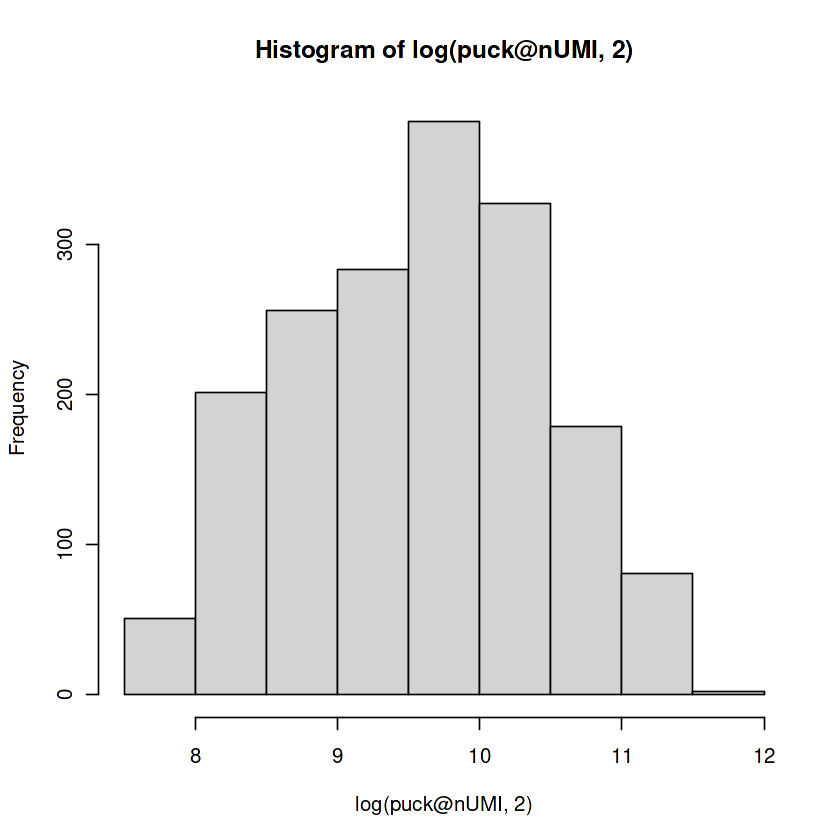

In [13]:
## Examine SpatialRNA object 
print(dim(puck@counts)) # observe Digital Gene Expression matrix
hist(log(puck@nUMI,2)) # histogram of log_2 nUMI

                                    x     y
V10F03.034_C_AAACACCAATAACTGC.1 10669 33559
V10F03.034_C_AAACAGCTTTCAGAAG.1  7764 25472
V10F03.034_C_AAACAGGGTCTATATT.1  8926 27494
V10F03.034_C_AAACAGTGTTCCTGGG.1 17640 40636
V10F03.034_C_AAACATGGTGAGAGGA.1  5150 35075
V10F03.034_C_AAACATTTCCCGGATT.1 33327 34571


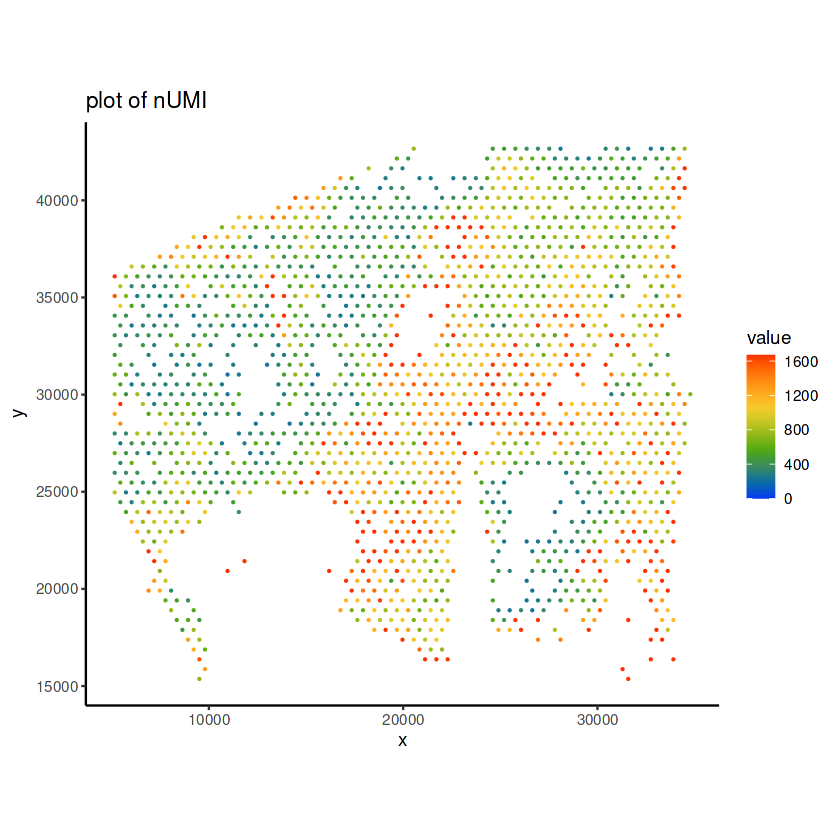

In [14]:
print(head(puck@coords)) # start of coordinate data.frame
barcodes <- colnames(puck@counts) # pixels to be used (a list of barcode names). 

# This list can be restricted if you want to crop the puck e.g. 
# puck <- restrict_puck(puck, barcodes) provides a basic plot of the nUMI of each pixel

plot_puck_continuous(puck, barcodes, puck@nUMI, ylimit = c(0,round(quantile(puck@nUMI,0.9))), 
                     title ='plot of nUMI') 

The RDS file ‘puck.RDS’ saves the ‘SpatialRNA’ file we have created, and from now on it can be loaded in by the init_RCTD function. 

## Running RCTD

Running RCTD is a two-step process:

1. Preprocess the data using the createRctd function, which:

* Filters pixels and genes based on UMI counts and other thresholds.
* dentifies differentially expressed genes.
* Creates cell type profiles from the reference data.

2. Run the deconvolution with runRctd.

### Merging Small Cell Groups
------------------------------------------------------------------------------
Merging detailed cell types into major groups for RCTD analysis

The reference dataset contains many detailed cell types with varying cell counts.
For stable and reliable analysis, we merge these detailed types into broader biologically meaningful groups such as 'Endothelial', 'CAFs', 'B-cells', etc.
This grouping helps meet the minimum cell count requirements (>=25 cells per group) and simplifies downstream interpretation.
The mapping is done by defining which detailed cell types belong to each major group and then replacing the cell types in the reference accordingly.



In [15]:
detailed_types <- as.character(reference@cell_types)


In [16]:
major_group_map <- list(
  'Endothelial' = c("Endothelial ACKR1", "Endothelial CXCL12", "Endothelial Lymphatic LYVE1", "Endothelial RGS5"),
  'CAFs' = c("CAFs MSC iCAF-like s1", "CAFs MSC iCAF-like s2", "CAFs myCAF like s4", "CAFs myCAF like s5", "CAFs Transitioning s3"),
  'PVL' = c("Cycling PVL"),
  'B-cells' = c("B cells Memory", "B cells Naive"),
  'T-cells' = c("T_cells_c6_IFIT1", "T_cells_c7_CD8+_IFNG", "T_cells_c8_CD8+_LAG3", "T_cells_c9_NK_cells_AREG"),
  'Myeloid' = c("Myeloid_c0_DC_LAMP3", "Myeloid_c1_LAM1_FABP5", "Myeloid_c10_Macrophage_1_EGR1", "Myeloid_c11_cDC2_CD1C", "Myeloid_c12_Monocyte_1_IL1B", "Myeloid_c2_LAM2_APOE", "Myeloid_c3_cDC1_CLEC9A", "Myeloid_c4_DCs_pDC_IRF7", "Myeloid_c7_Monocyte_3_FCGR3A", "Cycling_Myeloid"),
  'Normal Epithelial' = c("Luminal Progenitors", "Mature Luminal"),
  'Plasmablasts' = c("Plasmablasts"),
  'Cancer Epithelial' = c("Cancer Basal SC", "Cancer Cycling", "Cancer Her2 SC", "Cancer LumA SC", "Cancer LumB SC")
)


In [17]:
map_to_major <- function(cell_type) {
  for (major in names(major_group_map)) {
    if (cell_type %in% major_group_map[[major]]) {
      return(major)
    }
  }
  return(NA)  # If there is a mismatched cell type, leave NA
}

In [18]:
major_cell_types <- sapply(detailed_types, map_to_major)


In [19]:
major_cell_types <- factor(major_cell_types)
reference@cell_types <- major_cell_types


In [20]:
table(reference@cell_types)



          B-cells              CAFs Cancer Epithelial       Endothelial 
              570              2395             11878              5105 
          Myeloid Normal Epithelial      Plasmablasts               PVL 
             1450              1717               540                18 
          T-cells 
             1376 

### Merging Small Cell Group "PVL"

The "PVL" (Perivascular-like) cell group in the reference dataset contains only 18 cells, which is below the minimum threshold of 25 required by RCTD.  
To maintain analysis integrity, these cells were merged into the "T-cells" group, which is biologically relevant due to their shared immune or stromal functions.  
This adjustment ensures that all cell types meet the minimum cell count requirement and improves the robustness of downstream deconvolution.


In [21]:
# Merge PVL cells into T-cells
reference@cell_types[reference@cell_types == "PVL"] <- "T-cells"

# If it is a factor, let's rearrange the levels
reference@cell_types <- droplevels(reference@cell_types)

# Control
table(reference@cell_types)


          B-cells              CAFs Cancer Epithelial       Endothelial 
              570              2395             11878              5105 
          Myeloid Normal Epithelial      Plasmablasts           T-cells 
             1450              1717               540              1394 

### Removing NA and Unknown Cell Types from Reference

To ensure the reference dataset contains only well-defined cell types, we remove any cells with missing (`NA`) or `"Unknown"` cell type annotations. This cleaning step is crucial because ambiguous or undefined cell types in the reference can degrade the accuracy of downstream analyses such as RCTD deconvolution.

- First, cells with `NA` values in `cell_types` are filtered out.
- Then, if the level `"Unknown"` exists, those cells are also removed.
- Finally, we verify the cleaned cell type distribution to ensure the reference dataset contains only valid annotated cell types.

This preprocessing improves the reliability of spatial transcriptomics cell type deconvolution.


In [22]:
# Get cell type vector
cell_types <- reference@cell_types

# Create indexes that will remove NA or "Unknown" ones
keep_cells <- !is.na(cell_types) & cell_types != "Unknown"

# Filter all slots with the same cells
reference@cell_types <- droplevels(cell_types[keep_cells])
reference@counts     <- reference@counts[, keep_cells]
reference@nUMI       <- reference@nUMI[keep_cells]


In [23]:
# Is there NA anymore?
anyNA(reference@cell_types)

# Remaining cell type numbers
table(reference@cell_types)


[1] FALSE


          B-cells              CAFs Cancer Epithelial       Endothelial 
              570              2395             11878              5105 
          Myeloid Normal Epithelial      Plasmablasts           T-cells 
             1450              1717               540              1394 

In [24]:
common_genes <- intersect(rownames(puck@counts), rownames(reference@counts))
length(common_genes)  # Shows how many genes are in common


[1] 0

In [25]:
head(rownames(reference@counts), 10)


[1] "RP11-34P13.7"  "FO538757.3"    "FO538757.2"    "AP006222.2"   
 [5] "RP4-669L17.10" "RP5-857K21.4"  "RP11-206L10.9" "LINC00115"    
 [9] "FAM41C"        "RP11-54O7.3"

In [26]:
head(rownames(puck@counts), 10)


[1] "ENSG00000241860" "ENSG00000237491" "ENSG00000228794" "ENSG00000223764"
 [5] "ENSG00000187634" "ENSG00000188976" "ENSG00000187961" "ENSG00000187583"
 [9] "ENSG00000187642" "ENSG00000272512"

### Converting ENSEMBL IDs to Gene Symbols (for RCTD Compatibility)

In RCTD, the `reference` dataset uses **gene symbols** (e.g., `FAM41C`, `LINC00115`), while the `spatialRNA` dataset may use **ENSEMBL IDs** (e.g., `ENSG00000187634`, `ENSG00000187583`).  
If gene names do not match between these datasets, **RCTD will throw an error** due to no overlapping genes.

```r
Error: 0 common genes between SpatialRNA and Reference objects

In [27]:
if (!require("org.Hs.eg.db")) install.packages("BiocManager")
BiocManager::install("org.Hs.eg.db")
library(org.Hs.eg.db)

Loading required package: org.Hs.eg.db

Loading required package: AnnotationDbi

Loading required package: stats4



Loading required package: BiocGenerics

Loading required package: generics


Attaching package: ‘generics’


The following objects are masked from ‘package:base’:

    as.difftime, as.factor, as.ordered, intersect, is.element, setdiff,
    setequal, union



Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.call, duplicated, eval, evalq, Filter, Find,
    get, grep, grepl, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, saveRDS, table, tapply, unique,
    unsplit, which.max, which.min


Loading required package: Biobase

Welcome to Bioconductor

    Vignettes contain introductory material; view with
    'browseVignettes()'. To cite Bioconductor, see
    'citation("Bioba

In [28]:
library(org.Hs.eg.db)

# Get existing ENSEMBL IDs
ensembl_ids <- rownames(puck@counts)

# ENSEMBL -> SYMBOL conversion
converted <- mapIds(org.Hs.eg.db,
                    keys = ensembl_ids,
                    column = "SYMBOL",
                    keytype = "ENSEMBL",
                    multiVals = "first")

# Select non-NAs (i.e. matches)
valid_genes <- !is.na(converted)
converted_counts <- puck@counts[valid_genes, ]
rownames(converted_counts) <- converted[valid_genes]

# Create new puck object
puck@counts <- converted_counts


'select()' returned 1:many mapping between keys and columns



#### Step 1: Preprocess Data

Before running RCTD, we perform some preprocessing with createRctd. Some important configuration options include:

* **gene_cutoff**, **fc_cutoff**: Used for filtering genes in platform effect normalization. gene_cutoff filters for average expression and fc_cutoff filters for log fold change across cell types.

* **gene_cutoff_reg**, **fc_cutoff_reg**: Similar to above, but for the RCTD step.

* **UMI_min**, **UMI_max**: Minimum and maximum UMI count per pixel.


In [29]:
myRCTD <- create.RCTD(puck, reference, max_cores = 1
            ) 

Begin: process_cell_type_info

process_cell_type_info: number of cells in reference: 25049

process_cell_type_info: number of genes in reference: 29733




          B-cells              CAFs Cancer Epithelial       Endothelial 
              570              2395             11878              5105 
          Myeloid Normal Epithelial      Plasmablasts           T-cells 
             1450              1717               540              1394 


Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 2.6 GiB”
Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.1 GiB”
End: process_cell_type_info

create.RCTD: getting regression differentially expressed genes: 

get_de_genes: B-cells found DE genes: 85

get_de_genes: CAFs found DE genes: 192

get_de_genes: Cancer Epithelial found DE genes: 164

get_de_genes: Endothelial found DE genes: 190

get_de_genes: Myeloid found DE genes: 167

get_de_genes: Normal Epithelial found DE genes: 98

get_de_genes: Plasmablasts found DE genes: 35

get_de_genes: T-cells found DE genes: 178

get_de_genes: total DE genes: 918

create.RCTD: getting platform effect normalization differentially expressed genes: 

get_de_genes: B-cells found DE genes: 220

get_de_genes: CAFs found DE genes: 368

get_de_genes: Cancer Epithelial found DE genes: 375

get_de_genes: Endothelial found DE genes: 391

get_de_genes: Myeloid found DE genes: 326

#### Step 2: Run RCTD

Now we can run RCTD on the preprocessed data with the runRctd function.

RCTD has three modes, each suited for different spatial technologies:

* **"doublet"**: Assigns 1-2 cell types per pixel. Best for high-resolution technologies like Slide-seq and MERFISH.

* **"multi"**: Like doublet mode but can assign more cell types (up to max_multi_types). Best for lower-resolution technologies like 100-micron Visium.
"full": No restrictions on number of cell types.

The rctd_mode argument is used to specify the mode in which the RCTD algorithm runs. Other important configuration options include:

* **max_cores**: Number of cores used for parallel processing. We recommend setting this to at least 4 to improve efficiency. If set to 1, parallel processing is not used.

* **max_multi_types**: Maximum number of cell types per pixel (multi mode only).

In [30]:
myRCTD <- run.RCTD(myRCTD, doublet_mode = 'doublet')

fitBulk: decomposing bulk



chooseSigma: using initial Q_mat with sigma =  1

Likelihood value: 398454.572920316

Sigma value:  0.84

Likelihood value: 393948.165416769

Sigma value:  0.69

Likelihood value: 390718.541214361

Sigma value:  0.61

Likelihood value: 389452.098632213

Sigma value:  0.53

Likelihood value: 388533.141232268

Sigma value:  0.45

Likelihood value: 387976.378991111

Sigma value:  0.4

Likelihood value: 387813.93291594

Sigma value:  0.38

Likelihood value: 387788.217476763

Sigma value:  0.37



[1] "gather_results: finished 1000"


RCTD returns a SpatialExperiment object containing:

Three assays (one in full mode):

* **weights**: Cell type proportions restricted according to the specified mode
* **weights_unconfident**: Cell type proportions restricted according to the specified mode, including unconfident predictions (not available in full mode)
* **weights_full**: Unrestricted cell type proportions (not available in full mode, use weights instead)

Assays have cell types as rows and pixels as columns, with values representing the proportion (0 to 1) of each cell type in each pixel. Assay columns sum to 1 (except for rejected pixels, which sum to 0).

**NOTE**: Weights are transposed compared to the output of the original dmcable/spacexr package on GitHub.

* Spatial coordinates for each pixel stored in spatialCoords.

* Additional colData including:

  * For doublet mode:
* **spot_class**: Classification as singlet, doublet_certain, doublet_uncertain, or reject
* **first_type**, **second_type**: Predicted cell types
* Additional metrics like **min_score**, **singlet_score** for advanced users

   * For multi mode:
* **cell_type_list**: List of cell types per pixel
* **conf_list**: List of whether cell type predictions are confident
* Additional metrics like **min_score** for advanced users.

In [31]:
results <- myRCTD@results
# normalize the cell type proportions to sum to 1.
norm_weights = normalize_weights(results$weights) 
cell_type_names <- myRCTD@cell_type_info$info[[2]] #list of cell type names
spatialRNA <- myRCTD@spatialRNA

resultsdir <- 'RCTD_Plots'
dir.create(resultsdir)

Warning message in dir.create(resultsdir):
“'RCTD_Plots' already exists”


agg_record_7556818 
                 2

agg_record_7556818 
                 2

agg_record_7556818 
                 2

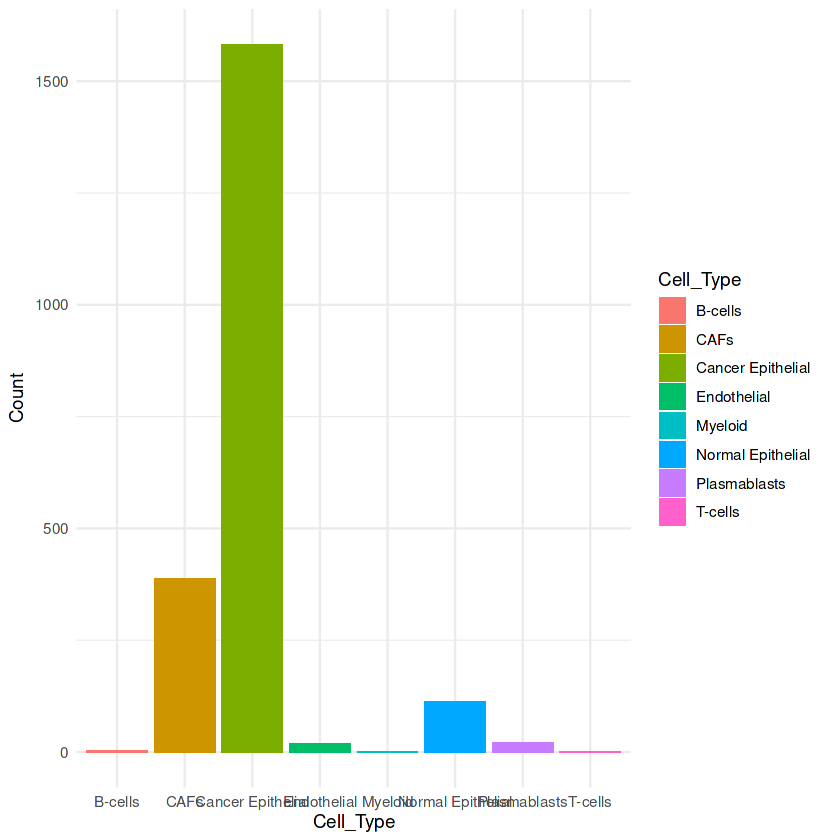

In [32]:
# Plot confident cell type weights (saved as 'results/cell_type_weights_unthreshold.pdf')
plot_weights(cell_type_names, spatialRNA, resultsdir, norm_weights)

# Plot all cell type weights without confidence threshold (saved as 'results/cell_type_weights.pdf')
plot_weights_unthreshold(cell_type_names, spatialRNA, resultsdir, norm_weights)

# Plot weights in doublet mode (saved as 'results/cell_type_weights_doublets.pdf')
plot_weights_doublet(cell_type_names, spatialRNA, resultsdir, results$weights_doublet, results$results_df)

# Plot number of confidently assigned pixels per cell type (saved as 'results/cell_type_occur.pdf')
plot_cond_occur(cell_type_names, resultsdir, norm_weights, spatialRNA)


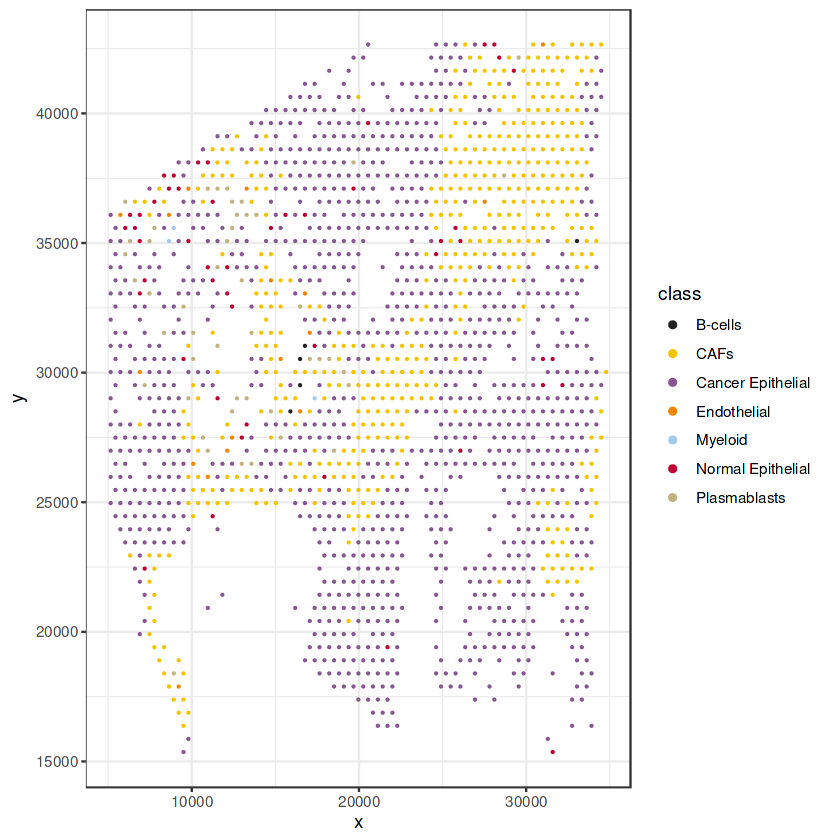

In [33]:
# makes a map of all cell types, (saved as 'results/all_cell_types.pdf')
plot_all_cell_types(results$results_df, spatialRNA@coords, cell_type_names, resultsdir) 

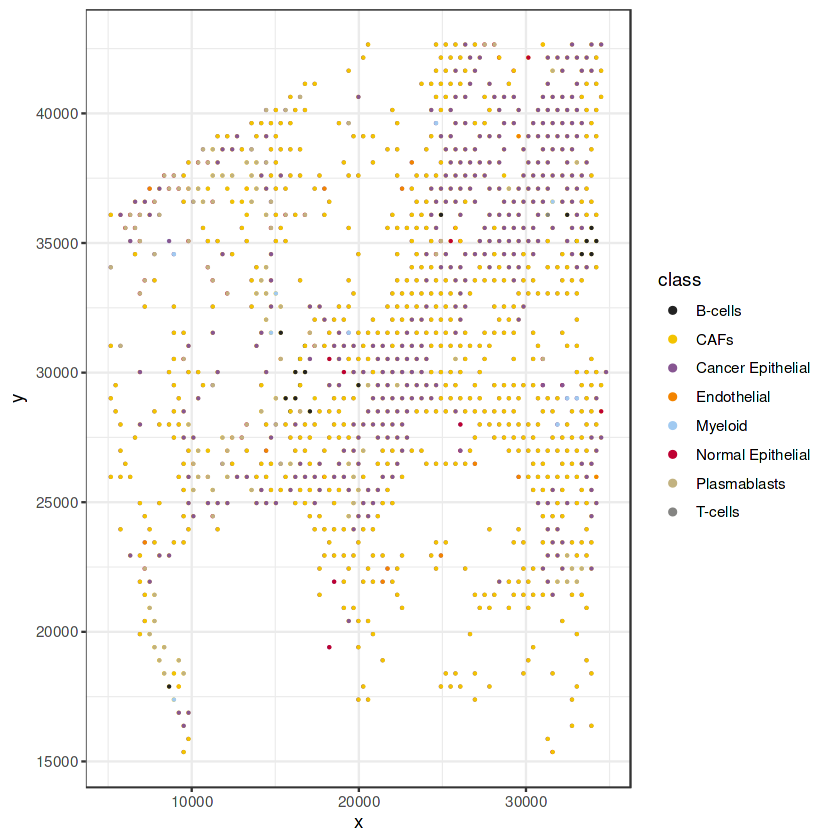

In [34]:
# doublets
#obtain a dataframe of only doublets
doublets <- results$results_df[results$results_df$spot_class == "doublet_certain",] 
# Plots all doublets in space (saved as 'results/all_doublets.pdf')
plot_doublets(spatialRNA, doublets, resultsdir, cell_type_names) 

agg_record_443827227 
                   2

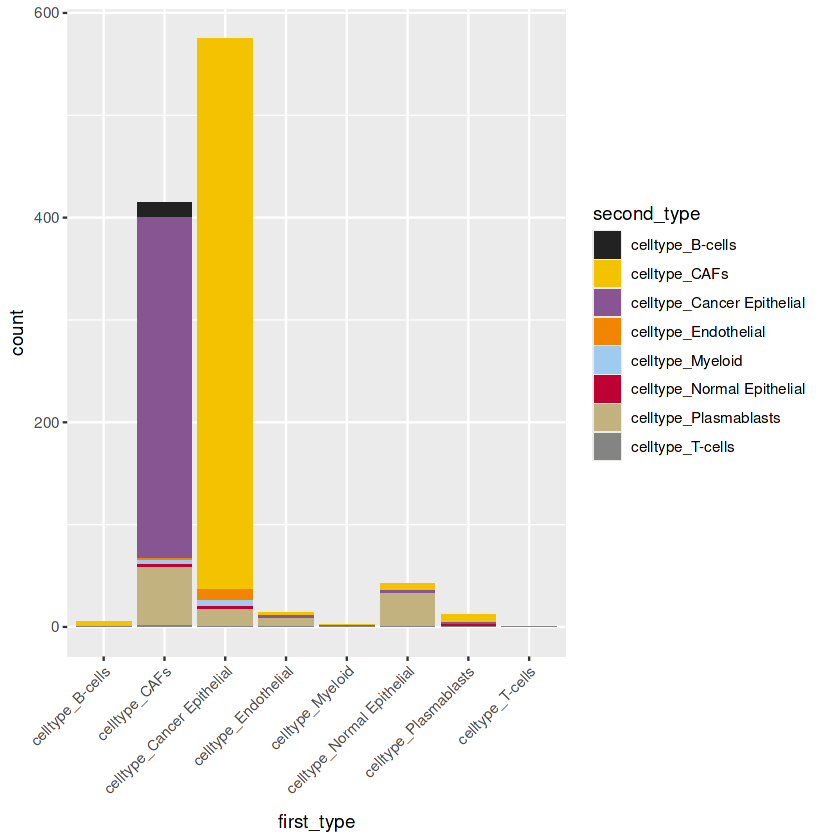

In [35]:
# Plots all doublets in space for each cell type (saved as 'results/all_doublets_type.pdf')
plot_doublets_type(spatialRNA, doublets, resultsdir, cell_type_names) 
# a table of frequency of doublet pairs 
doub_occur <- table(doublets$second_type, doublets$first_type) 
# Plots a stacked bar plot of doublet ocurrences (saved as 'results/doublet_stacked_bar.pdf')

plot_doub_occur_stack(doub_occur, resultsdir, cell_type_names) 

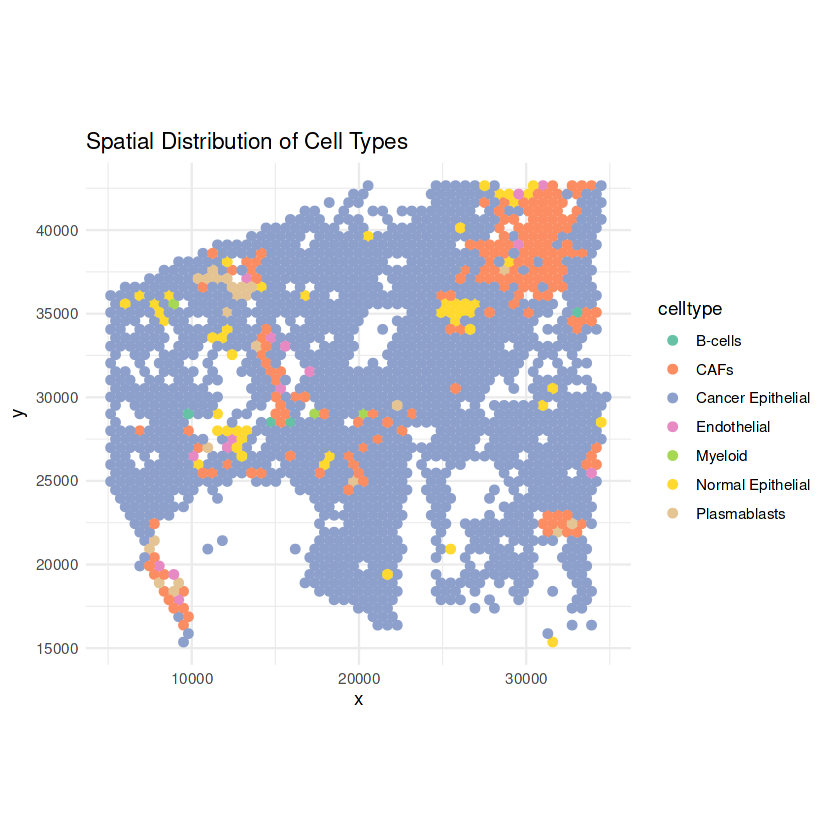

In [36]:
library(ggplot2)

# coords: data.frame with spot coordinates (x, y), rownames = barcodes
# celltype_pred: named vector or dataframe with celltype per spot (rownames match coords)

# Proportion matrix
proportion_matrix <- myRCTD@results$weights  

celltype_pred <- apply(proportion_matrix, 1, function(x) colnames(proportion_matrix)[which.max(x)])
names(celltype_pred) <- rownames(proportion_matrix)  # spot names 
df <- coords
df$celltype <- celltype_pred[rownames(coords)]

ggplot(df, aes(x = x, y = y, color = celltype)) +
  geom_point(size = 2) +
  scale_color_manual(values = RColorBrewer::brewer.pal(8, "Set2")) +
  coord_fixed() +
  theme_minimal() +
  ggtitle("Spatial Distribution of Cell Types")


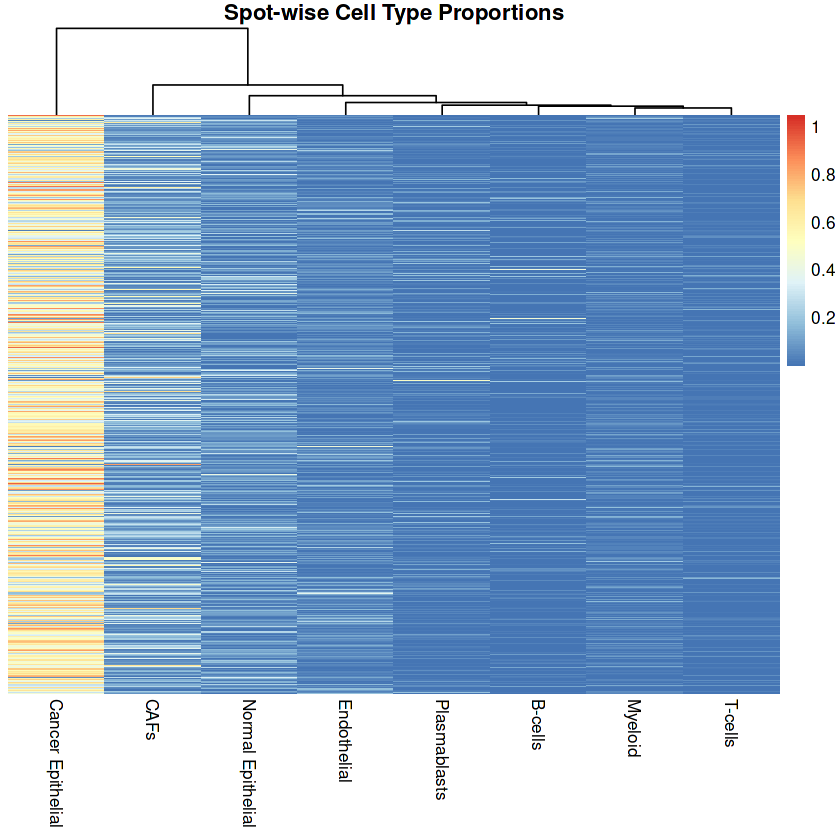

In [37]:
library(pheatmap)

# proportion_matrix: rows = spots, columns = cell types, values = proportions.
pheatmap(proportion_matrix, cluster_rows = FALSE, cluster_cols = TRUE,
         show_rownames = FALSE, main = "Spot-wise Cell Type Proportions")


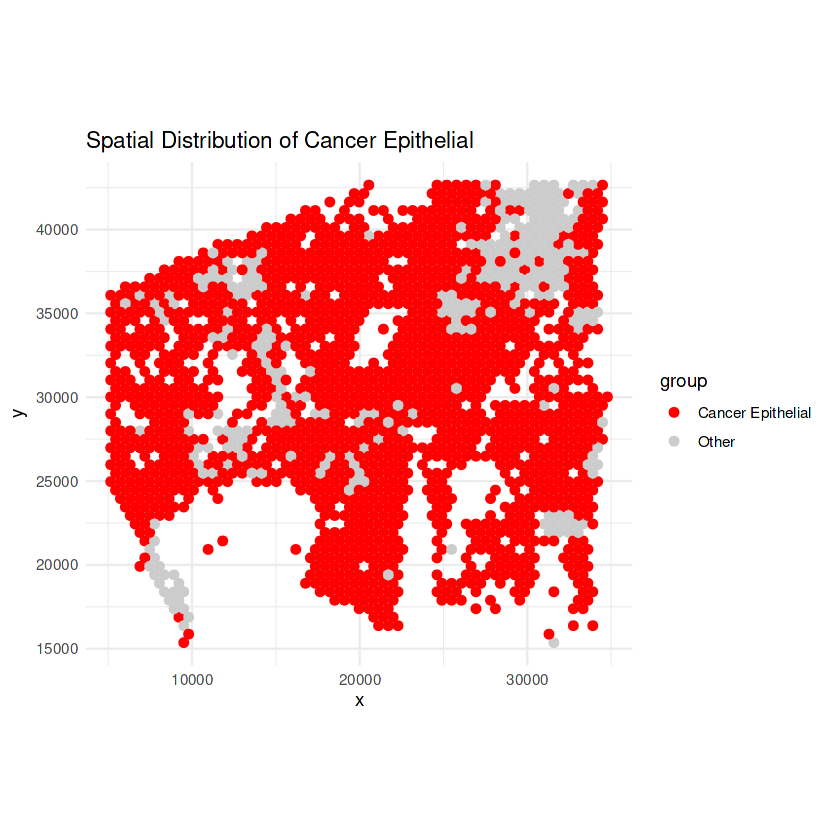

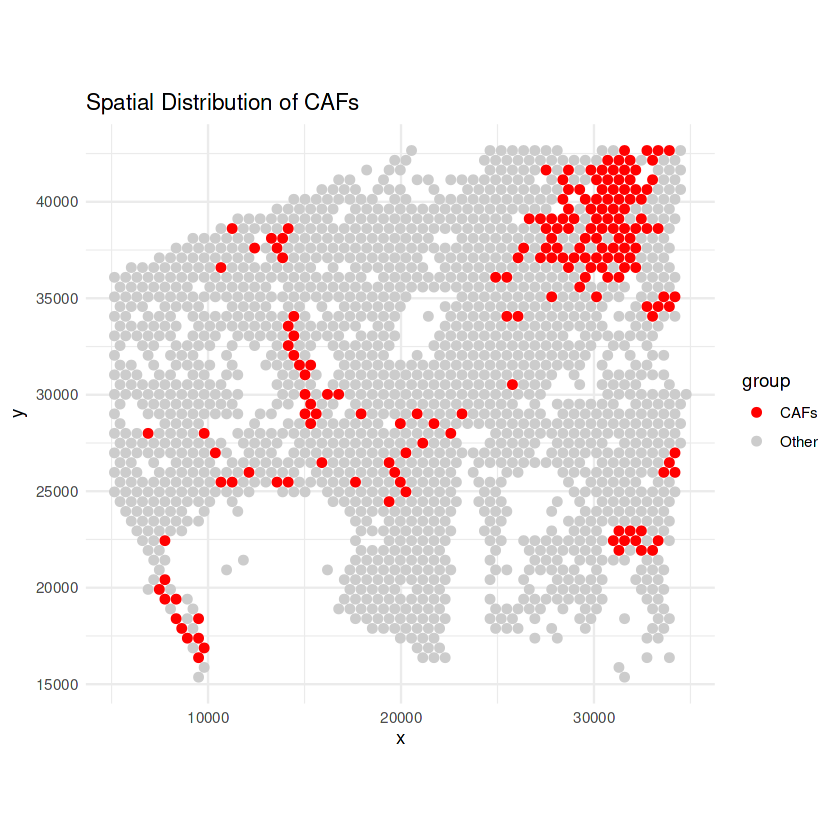

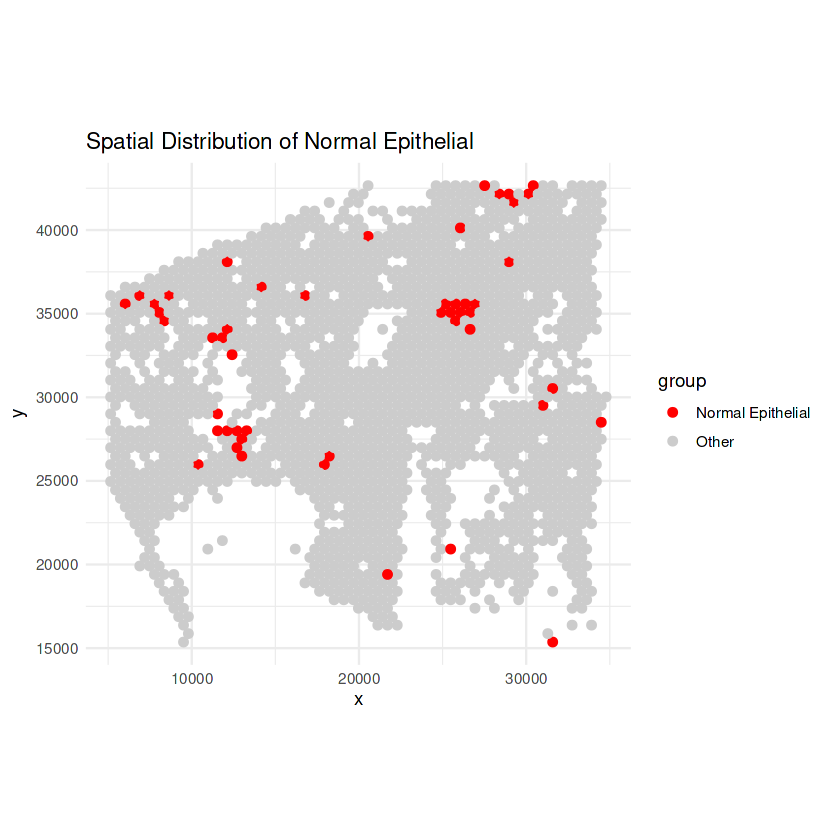

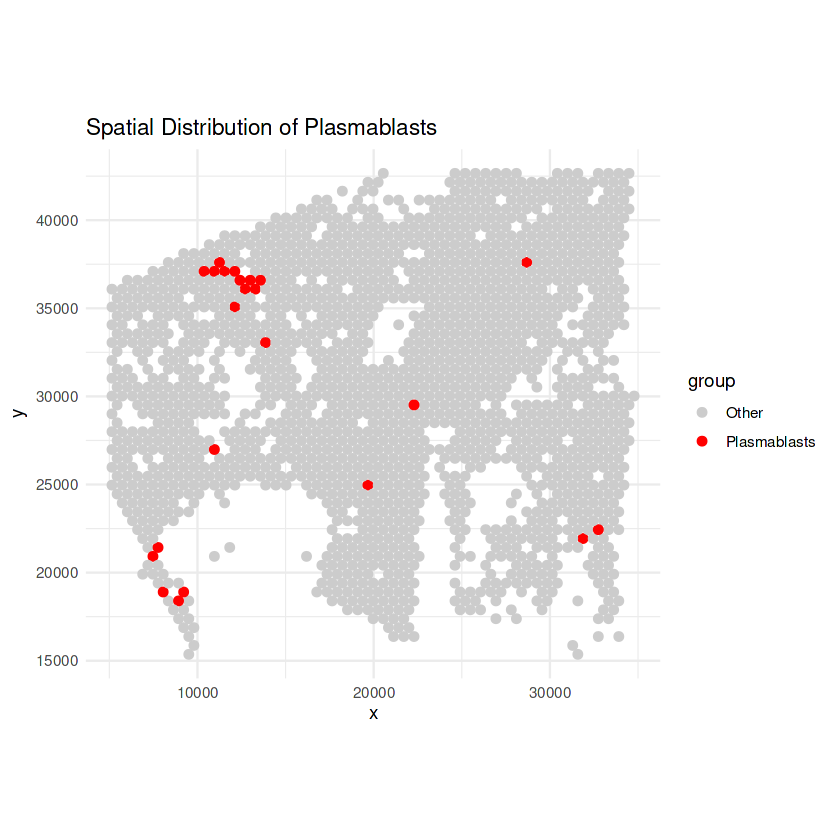

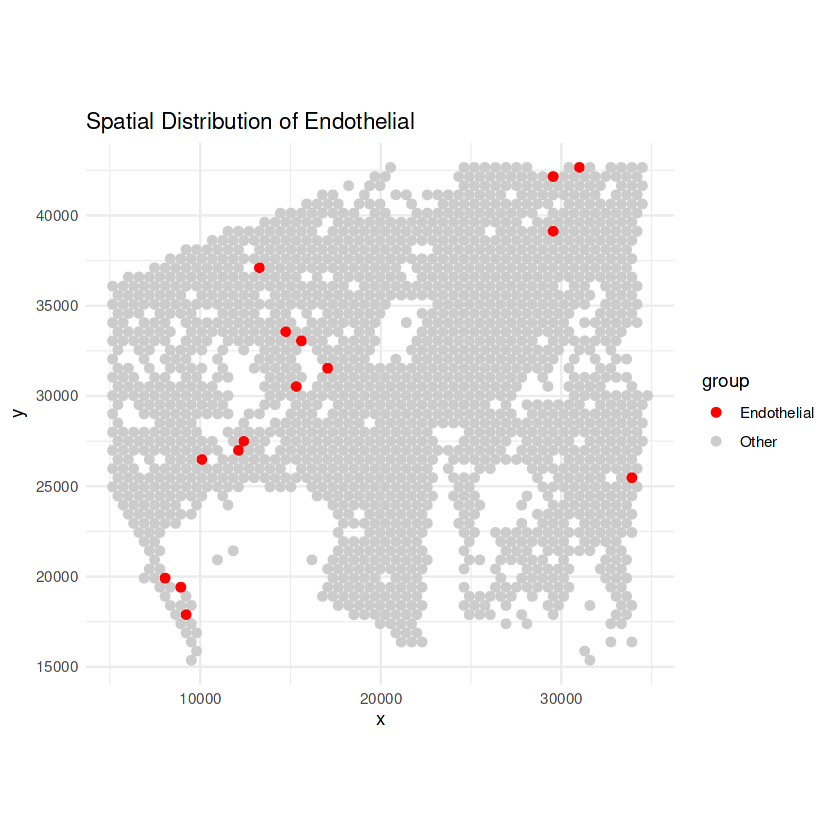

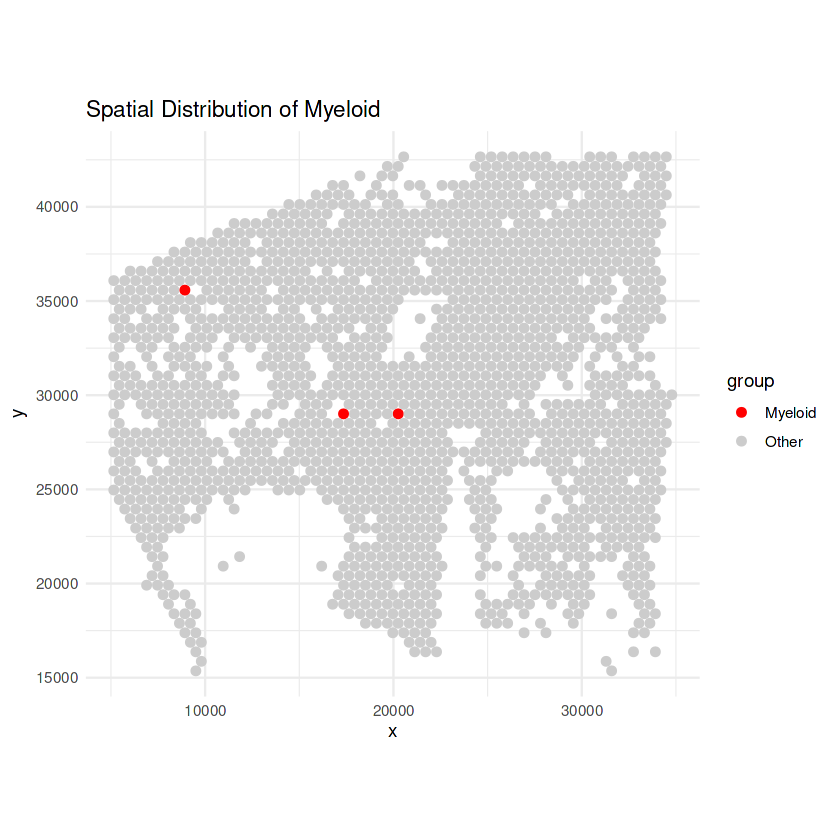

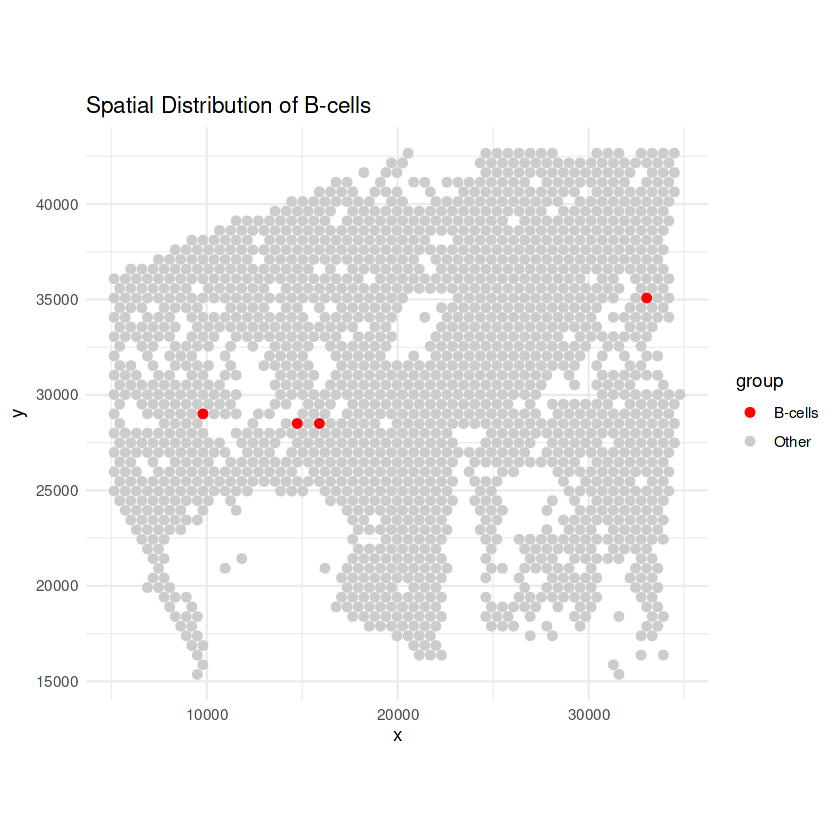

In [38]:
all_celltypes <- unique(celltype_pred)


library(ggplot2)
library(RColorBrewer)

for (ct in all_celltypes) {
  df <- coords
  df$group <- ifelse(celltype_pred[rownames(coords)] == ct, ct, "Other")
  
  p <- ggplot(df, aes(x = x, y = y, color = group)) +
    geom_point(size = 2) +
    scale_color_manual(values = c(setNames("red", ct), Other = "grey80")) +
    coord_fixed() +
    theme_minimal() +
    ggtitle(paste("Spatial Distribution of", ct))
  
  print(p)
}


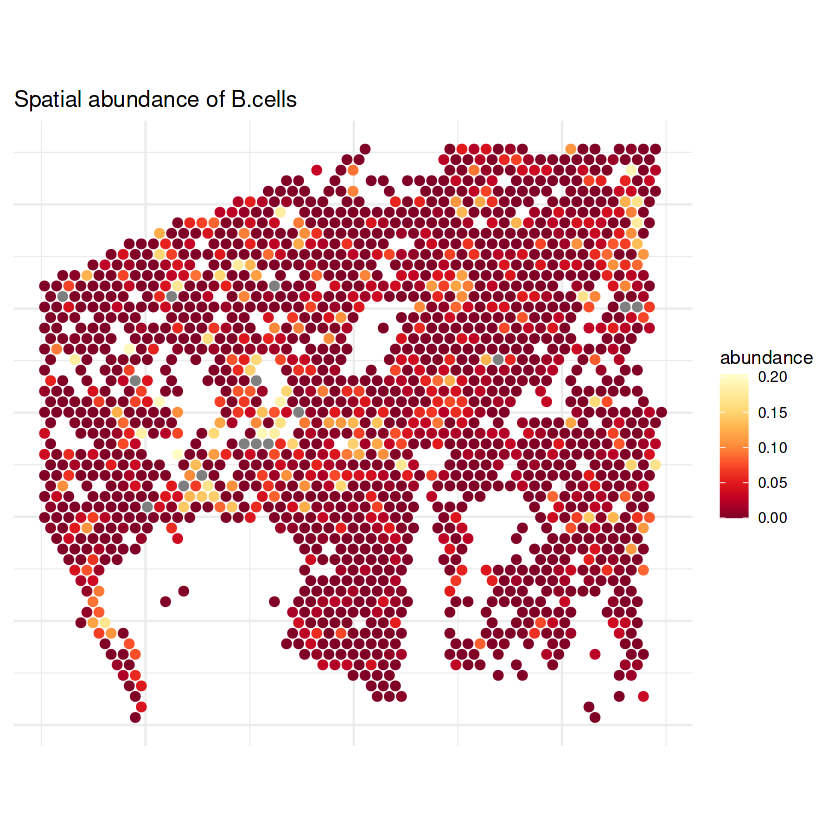

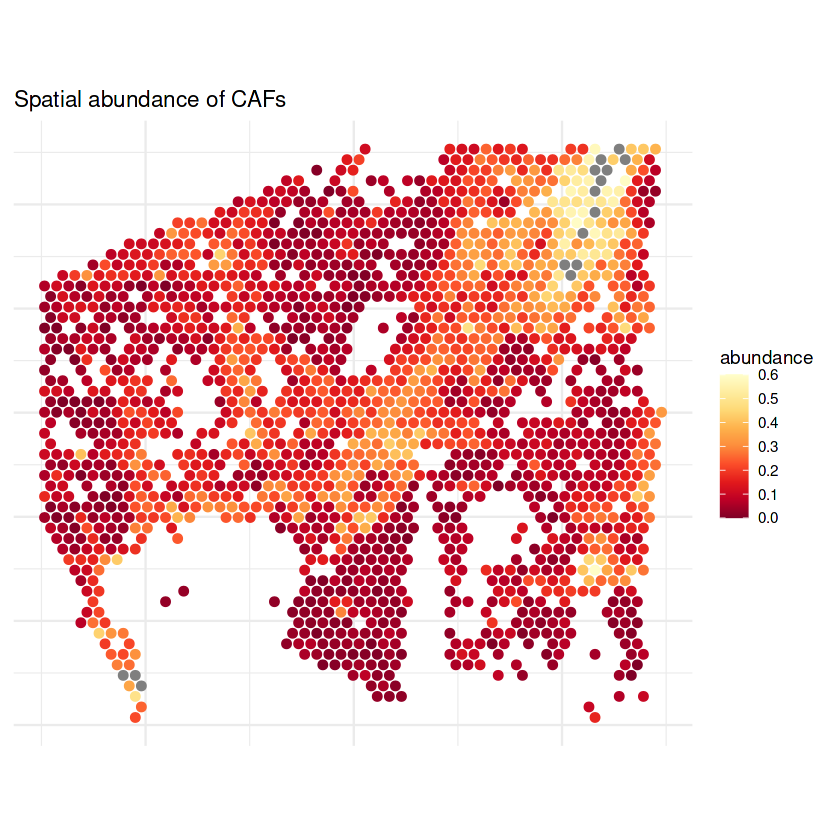

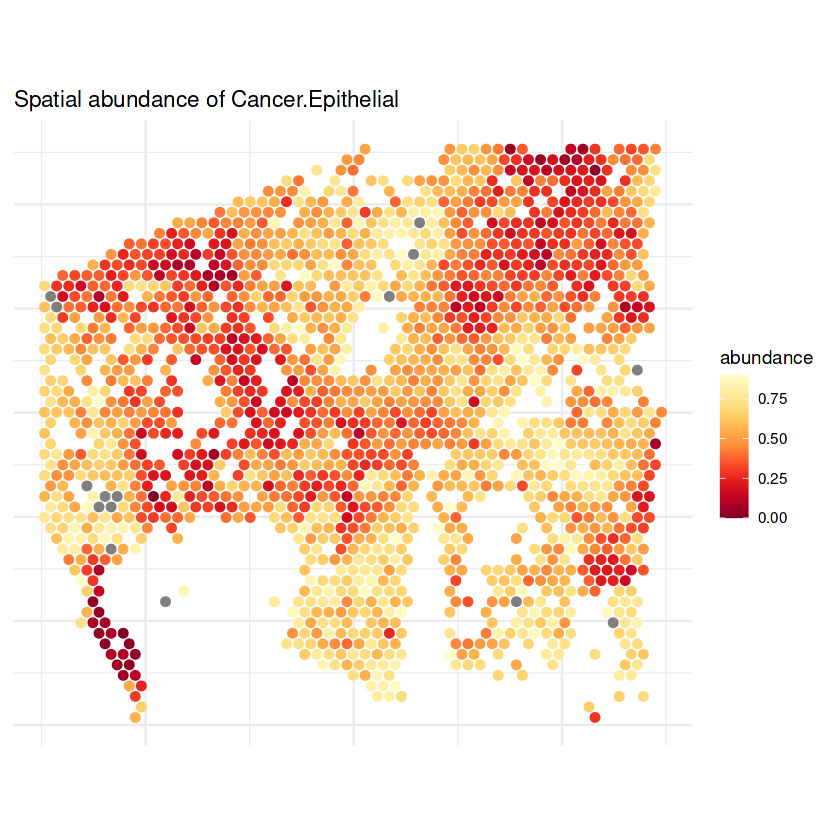

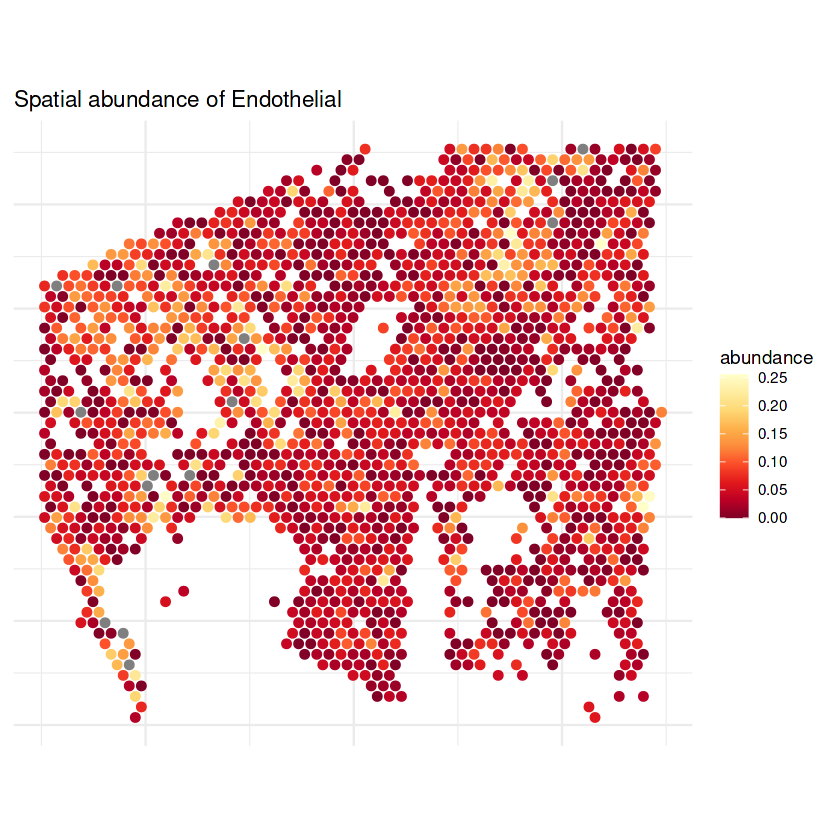

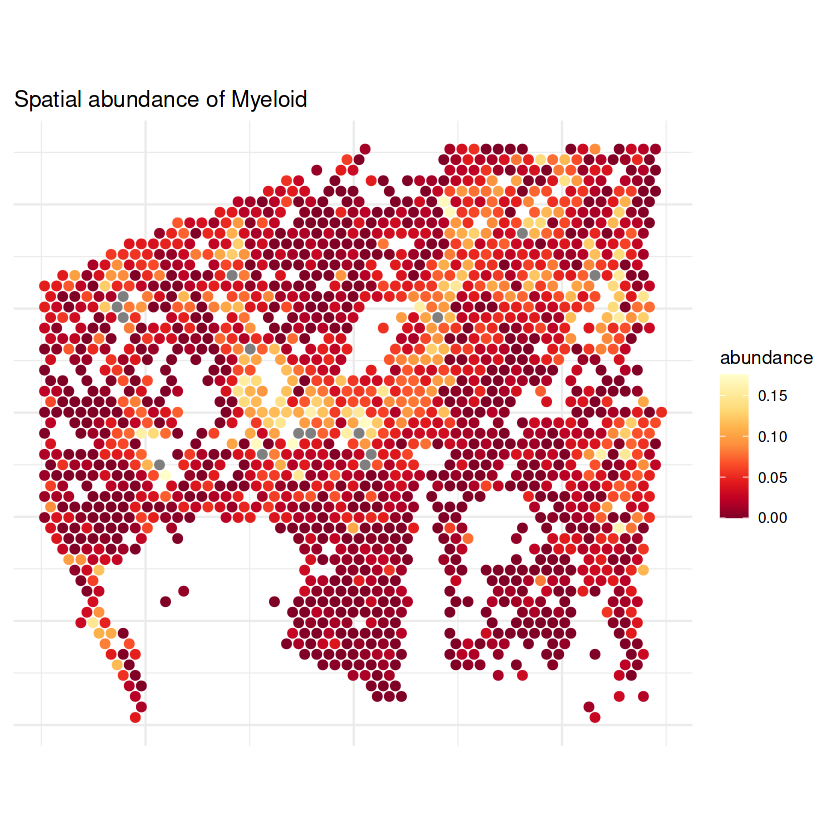

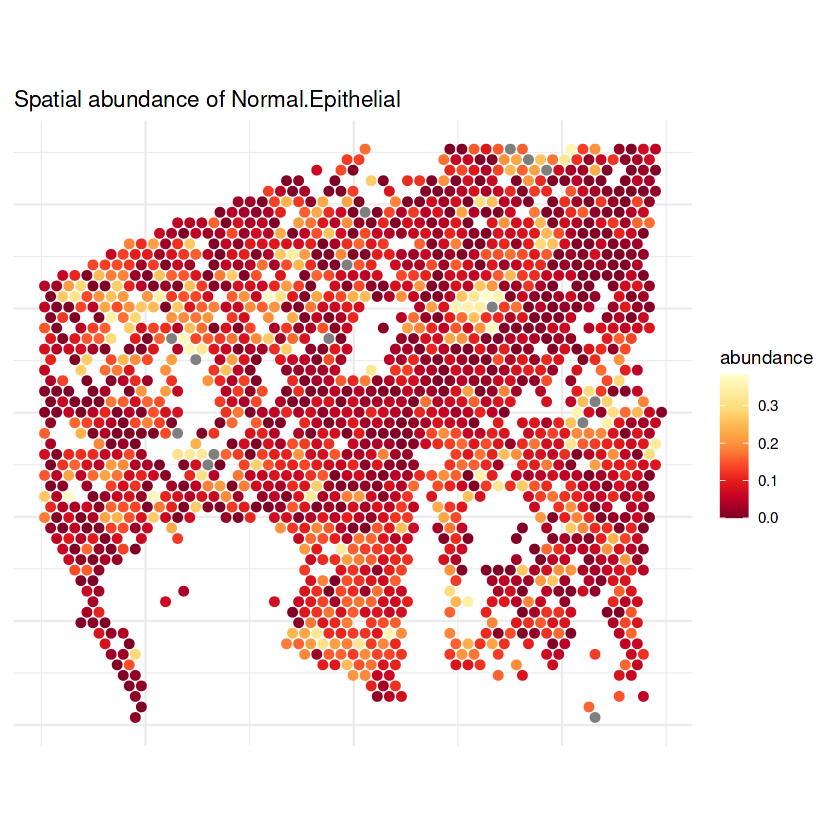

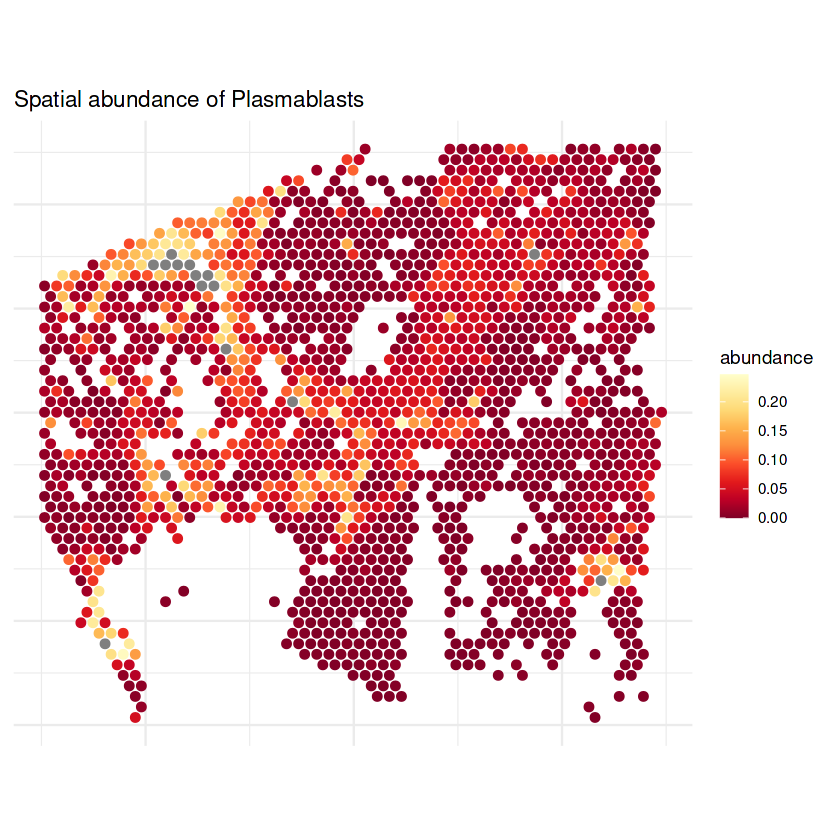

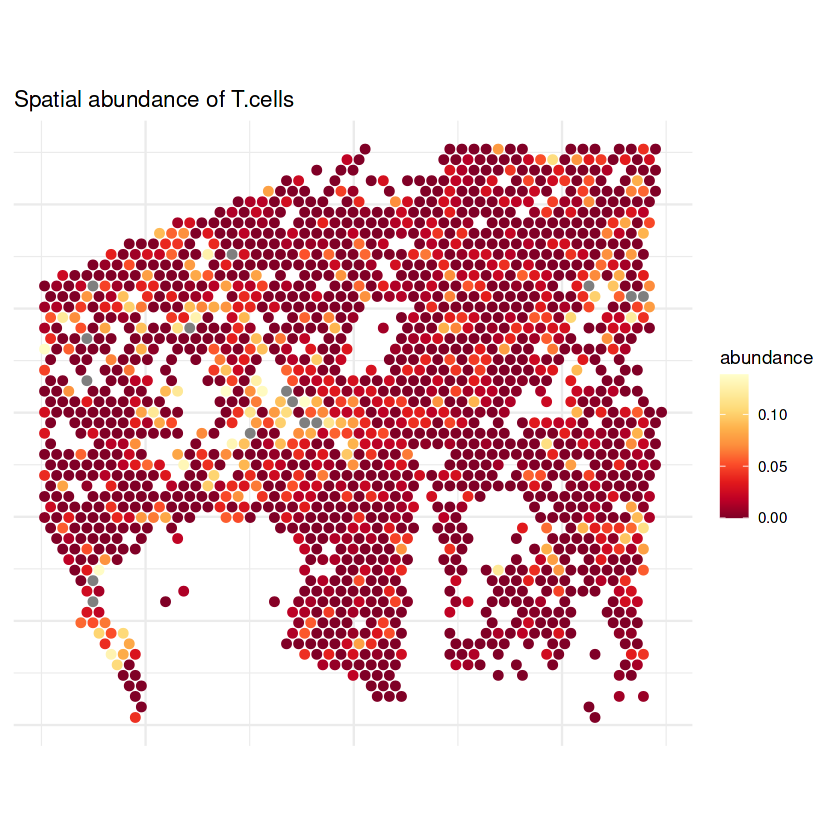

In [39]:
library(ggplot2)
library(reshape2)
library(RColorBrewer)

# coords: data.frame (x, y) spatial spot coordinates, rownames = spot names
# weights: myRCTD@results$weights, row = spot, column = cell type, value = abundance

weights <- myRCTD@results$weights
coords <- coords  # Here spatial coordinates, row names must be the same as weights

# Convert sparse matrix to dense matrix
weights_dense <- as.matrix(weights)

# Combine weights and coords (before melt)
df <- data.frame(coords, weights_dense)
df$spot <- rownames(df)

# Make a melt (convert to long format)
df_long <- melt(df, id.vars = c("x", "y", "spot"), variable.name = "celltype", value.name = "abundance")

# Sort cell types 
celltypes <- unique(df_long$celltype)

# color palette
pal <- colorRampPalette(rev(brewer.pal(9, "YlOrRd")))(100)

# Separate plot for each cell type, abundance color scale
for (ct in celltypes) {
  df_sub <- subset(df_long, celltype == ct)
  
  p <- ggplot(df_sub, aes(x = x, y = y, color = abundance)) +
    geom_point(size = 2) +
    scale_color_gradientn(colors = pal, limits = c(0, quantile(df_sub$abundance, 0.992))) + 
    coord_fixed() +
    theme_minimal() +
    ggtitle(paste("Spatial abundance of", ct)) +
    theme(axis.title = element_blank(),
          axis.text = element_blank(),
          axis.ticks = element_blank())
  
  print(p)

}


[1] B.cells           CAFs              Cancer.Epithelial Endothelial      
[5] Myeloid           Normal.Epithelial Plasmablasts      T.cells          
8 Levels: B.cells CAFs Cancer.Epithelial Endothelial ... T.cells

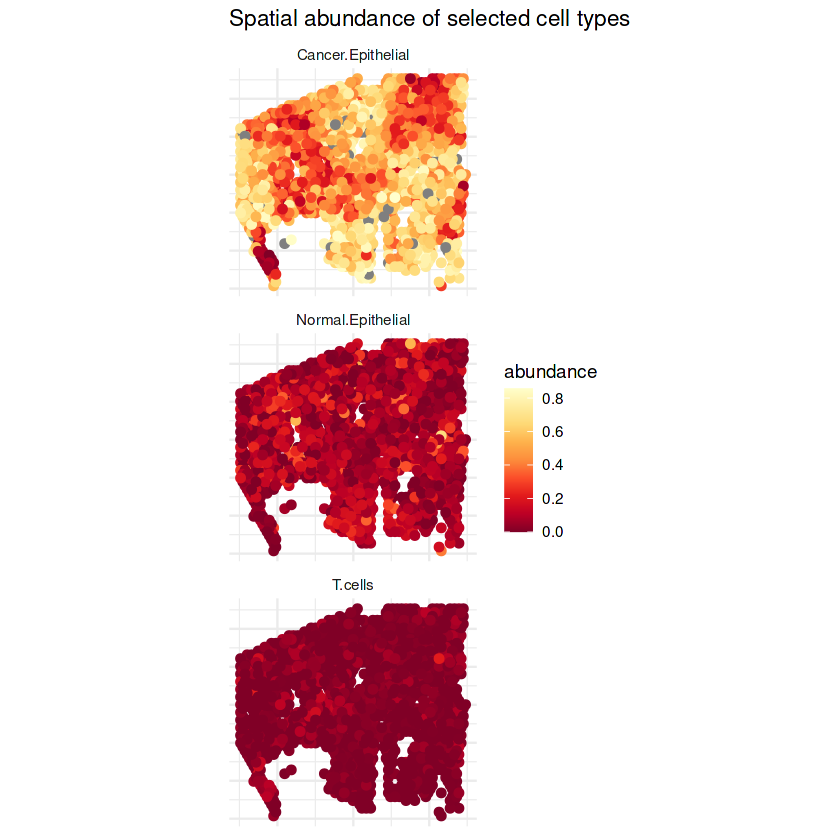

In [40]:
library(ggplot2)
library(reshape2)
library(RColorBrewer)

weights <- myRCTD@results$weights

# Convert sparse matrix to dense matrix
weights_dense <- as.matrix(weights)

df <- data.frame(coords, weights_dense)
df$spot <- rownames(df)
df_long <- melt(df, id.vars = c("x", "y", "spot"), variable.name = "celltype", value.name = "abundance")

unique(df_long$celltype)

# Select relevant cell types
selected_celltypes <- c('Cancer.Epithelial', 'T.cells', 'Normal.Epithelial') # Set by column names

df_sub <- subset(df_long, celltype %in% selected_celltypes)

pal <- colorRampPalette(rev(brewer.pal(9, "YlOrRd")))(100)

ggplot(df_sub, aes(x = x, y = y, color = abundance)) +
  geom_point(size = 2) +
  scale_color_gradientn(colors = pal, limits = c(0, quantile(df_sub$abundance, 0.992))) +
  coord_fixed() +
  theme_minimal() +
  facet_wrap(~celltype, ncol = 1) +
  ggtitle("Spatial abundance of selected cell types") +
  theme(axis.title = element_blank(),
        axis.text = element_blank(),
        axis.ticks = element_blank())


In [41]:
cell2loc_props <- read.csv("/disk2/user/hilpek/project_root/cell2location/outputs/cell2loc3_1/cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_1762locations_9factors/location_factors_mean/n_fact12.csv", row.names = 1)
head(cell2loc_props)

,mean_nUMI_factorsfact_0,mean_nUMI_factorsfact_1,mean_nUMI_factorsfact_2,mean_nUMI_factorsfact_3,mean_nUMI_factorsfact_4,mean_nUMI_factorsfact_5,mean_nUMI_factorsfact_6,mean_nUMI_factorsfact_7,mean_nUMI_factorsfact_8,mean_nUMI_factorsfact_9,mean_nUMI_factorsfact_10,mean_nUMI_factorsfact_11
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
V10F03-034_C_AAACACCAATAACTGC-1,5.355344,0,1.3239395,0.1853046,0,0,0,0.03764872,0.000000000,1.10277541,0,0.0000000
V10F03-034_C_AAACAGCTTTCAGAAG-1,19.284551,0,0.1508345,0.0000000,0,0,0,0.00000000,0.006086287,0.19536802,0,0.0000000
V10F03-034_C_AAACAGGGTCTATATT-1,12.180392,0,1.3892629,0.1312636,0,0,0,0.00000000,0.435928171,1.39195432,0,0.0000000
V10F03-034_C_AAACAGTGTTCCTGGG-1,7.285574,0,0.0000000,0.0000000,0,0,0,0.00000000,0.000000000,0.00000000,0,0.0000000
V10F03-034_C_AAACATGGTGAGAGGA-1,24.714028,0,5.1857972,0.0391198,0,0,0,0.35677607,0.000000000,0.72530326,0,0.0000000
V10F03-034_C_AAACATTTCCCGGATT-1,3.148231,0,10.2086535,0.0000000,0,0,0,0.44466801,0.000000000,0.07109939,0,0.0105327


`geom_smooth()` using formula = 'y ~ x'


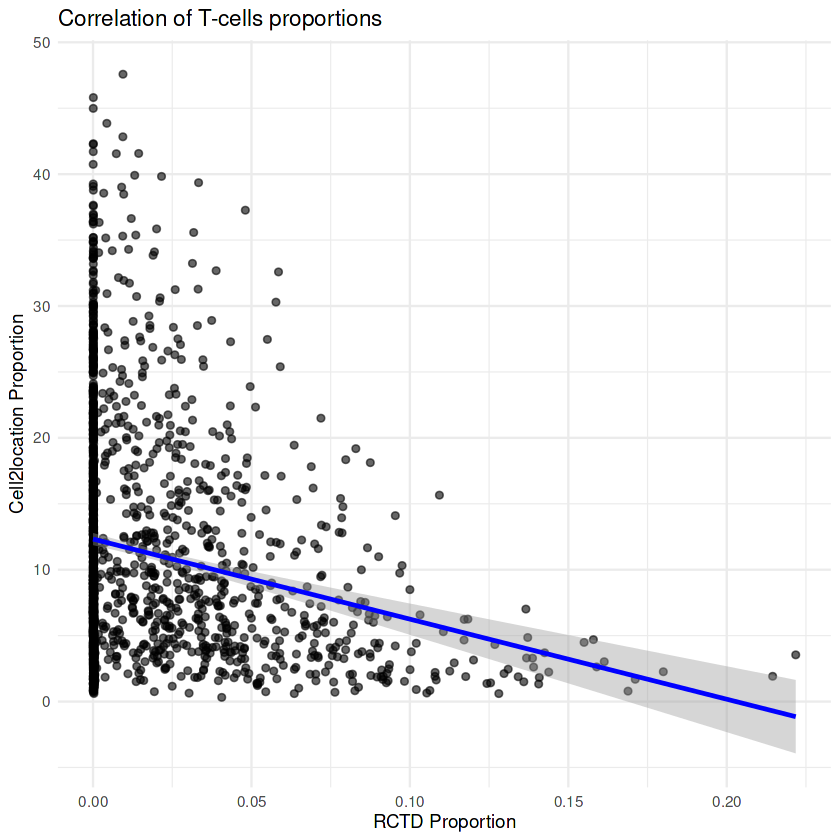

In [42]:
library(ggplot2)

df <- data.frame(
  RCTD = proportion_matrix[, "T-cells"],
  Cell2location = cell2loc_props[, "mean_nUMI_factorsfact_0"]
)


ggplot(df, aes(x = RCTD, y = Cell2location)) +
  geom_point(alpha = 0.6) +                  
  geom_smooth(method = "lm", color = "blue") + # Linear regression line
  ggtitle(paste("Correlation of","T-cells", "proportions")) +
  xlab("RCTD Proportion") +
  ylab("Cell2location Proportion") +
  theme_minimal()


`geom_smooth()` using formula = 'y ~ x'


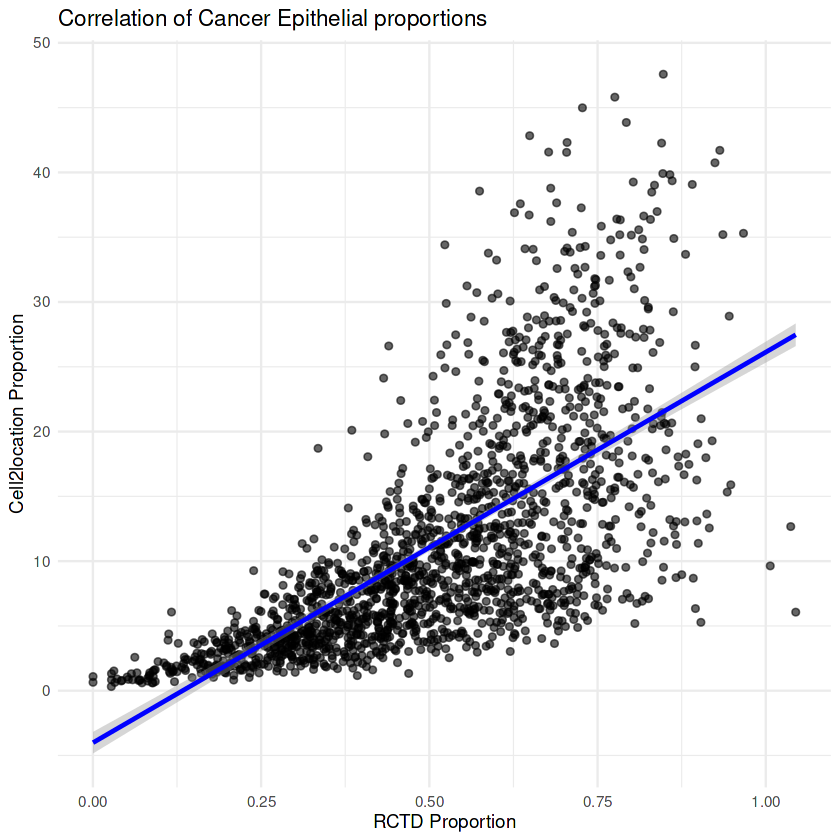

In [43]:
library(ggplot2)

df <- data.frame(
  RCTD = proportion_matrix[, "Cancer Epithelial"],
  Cell2location = cell2loc_props[, "mean_nUMI_factorsfact_0"]
)


ggplot(df, aes(x = RCTD, y = Cell2location)) +
  geom_point(alpha = 0.6) +                    
  geom_smooth(method = "lm", color = "blue") + # Linear regression line
  ggtitle(paste("Correlation of", "Cancer Epithelial", "proportions")) +
  xlab("RCTD Proportion") +
  ylab("Cell2location Proportion") +
  theme_minimal()


##### Correlation of Cancer Epithelial Proportions Estimated by RCTD and Cell2location

This scatter plot compares **Cancer Epithelial proportions** predicted by two spatial transcriptomics deconvolution tools:

- **RCTD** (`x-axis`)
- **Cell2location** (`y-axis`)

Each point represents a spatial spot.  
The blue line shows a **linear regression fit** between the two methods.

- A strong linear relationship suggests consistency between RCTD and Cell2location in localizing Cancer Epithelial.
- Transparency (`alpha = 0.6`) helps visualize overlapping points.


> *This plot shows the results for T-cells, but the same workflow can be repeated for other cell types.*


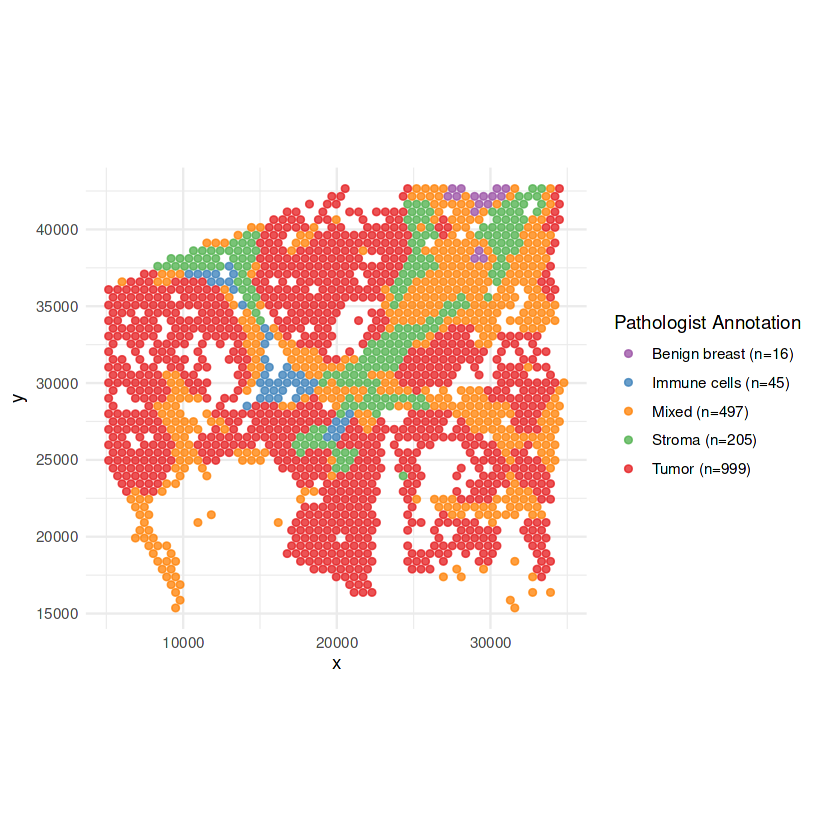

In [44]:
# Read Pathologist annotation csv
annoDf <- read.csv("/disk3/cda/SpatialTranscriptomics/pathologist_annotations/Tissue-annotations_pathologist-2-and-3_CSVs/V10F03-034_C_S7_Wenwen-annotations.csv", stringsAsFactors = FALSE)

# Match annotations to sample format
annoDf$Barcode <- gsub("-1$", ".1", annoDf$Barcode)
annoDf$Barcode <- paste0("V10F03.034_C_", annoDf$Barcode)
rownames(annoDf) <- annoDf$Barcode

# spatialRNA barcodes
barcodes <- rownames(spatialRNA@coords)

# Matching
pathologist_annos <- annoDf[barcodes, "Wenwen.annotations"]
pathologist_annos[pathologist_annos == ""] <- "Mixed"  # If there is an empty string
pathologist_annos[is.na(pathologist_annos)] <- "Mixed"


# RE-create df_plot
df_plot <- data.frame(
  x = spatialRNA@coords$x,
  y = spatialRNA@coords$y,
  annotation = pathologist_annos
)

# Determine color palette
ann_colors <- c(
  "Tumor" = "#E41A1C",
  "Immune cells" = "#377EB8",
  "Stroma" = "#4DAF4A",
  "Benign breast" = "#984EA3",
  "Mixed" = "#FF7F00",
  "Unlabeled" = "gray80"

)


# Get the number of annotation groups
ann_counts <- table(df_plot$annotation)
ann_labels <- paste0(names(ann_counts), " (n=", ann_counts, ")")
names(ann_labels) <- names(ann_counts)

# Plot (with labels)
ggplot(df_plot, aes(x = x, y = y, color = annotation)) +
  geom_point(size = 1.5, alpha = 0.75) +
  scale_color_manual(values = ann_colors, labels = ann_labels) +
  coord_fixed() +
  theme_minimal() +
  labs(color = "Pathologist Annotation")


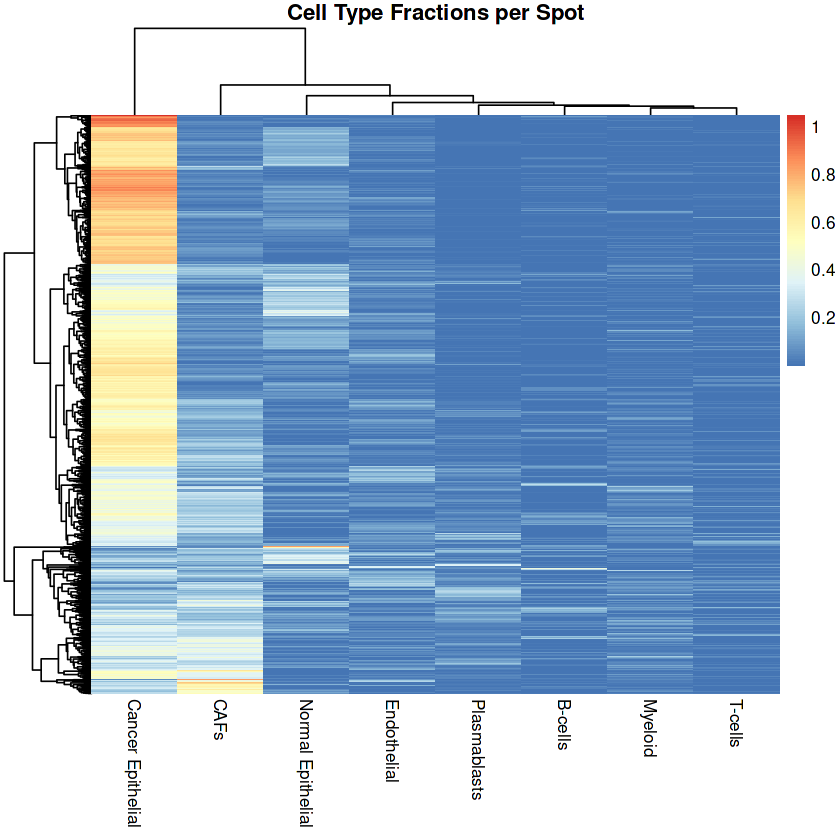

In [45]:
library(pheatmap)

# 'results' RCTD output
# the proportions of cell types for spots should be in matrix format.

weights <- myRCTD@results$weights

# Heatmap 
pheatmap(weights,
         cluster_rows = TRUE,
         cluster_cols = TRUE,
         show_rownames = FALSE,
         main = "Cell Type Fractions per Spot")


### Get rid of the multiple assignment problem (selecting maximum cell type idea)

The above cell shows that some portion of the spots have multiple cell types assigned to them, because multiple cell types have values above the threshold. However, the re-assignment idea requires a single cell type assigned to a spot, or none at all, so that the success of the model can be calculated by comparing to pathologist annotations (ground truth). In order to overcome this issue, we can try the following approach: For spots with no assignment, leave as blank. For spots with a single assignment, assign that cell type. For spots with multiple assignments, check the estimation values for cell types in the multiple assignment, and select the cell type with maximum estimation value as the final assignment.

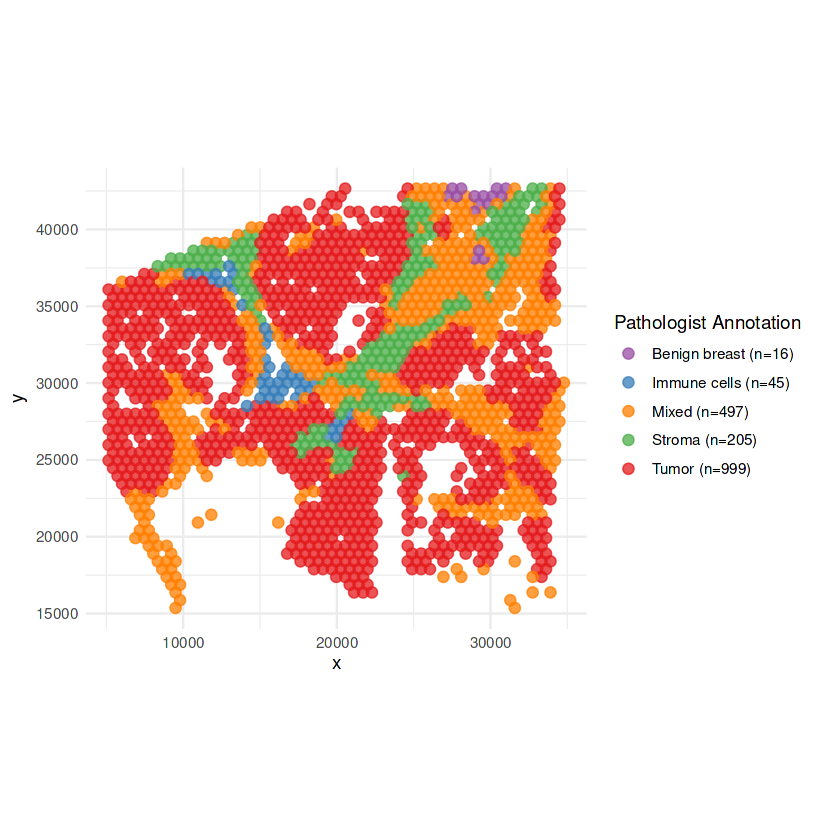

In [46]:
# RE-create df_plot
df_plot <- data.frame(
  x = spatialRNA@coords$x,
  y = spatialRNA@coords$y,
  annotation = pathologist_annos
)

# Determine color palette
ann_colors <- c(
  "Tumor" = "#E41A1C",
  "Immune cells" = "#377EB8",
  "Stroma" = "#4DAF4A",
  "Benign breast" = "#984EA3",
  "Mixed" = "#FF7F00",
  "Unlabeled" = "gray80"

)

# Plot (with labels)
ggplot(df_plot, aes(x = x, y = y, color = annotation)) +
  geom_point(size = 2.5, alpha = 0.75) +
  scale_color_manual(values = ann_colors, labels = ann_labels) +
  coord_fixed() +
  theme_minimal() +
  labs(color = "Pathologist Annotation")


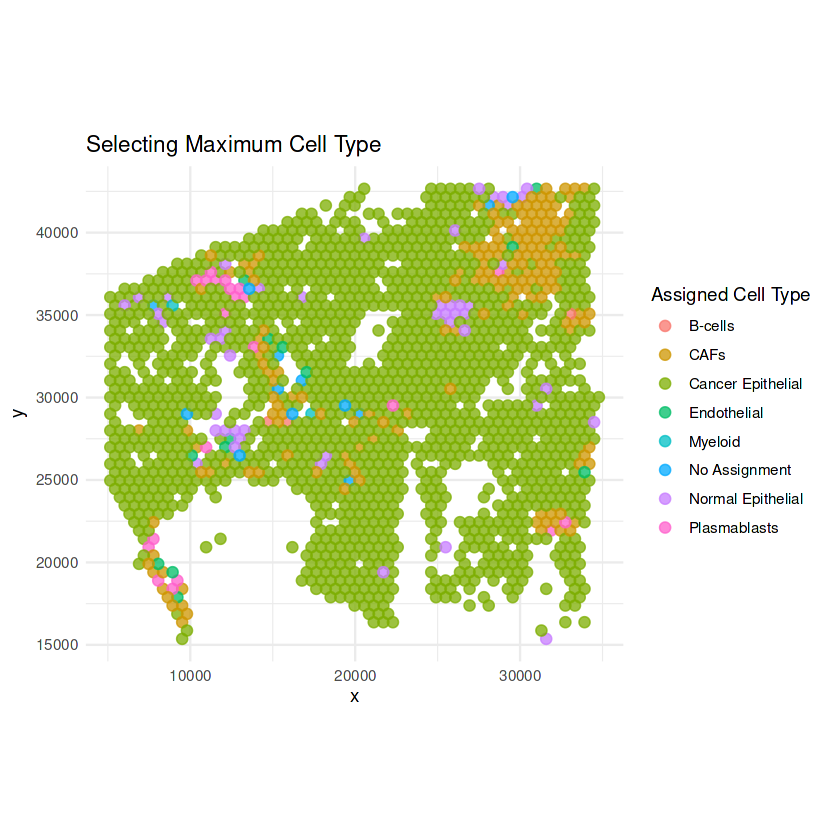

In [47]:
# Get cell type ratios
weights <- myRCTD@results$weights  # Spots in rows, cell types in columns

threshold <- 0.2

# Binary assignment: TRUE cell types are above the threshold
binary_assignments <- weights > threshold

# The cell type with the highest value for each spot
max_celltype <- apply(weights, 1, function(row) {
  if (all(row < threshold)) {
    return("No Assignment")
  } else {
    return(names(row)[which.max(row)])
  }
})

# create df_plot 
df_plot <- data.frame(
  x = spatialRNA@coords$x,
  y = spatialRNA@coords$y,
  AssignedCellType = max_celltype
)

library(ggplot2)

ggplot(df_plot, aes(x = x, y = y, color = AssignedCellType)) +
  geom_point(size = 2.5, alpha = 0.75) +
  coord_fixed() +
  theme_minimal() +
  labs(color = "Assigned Cell Type") +
  ggtitle("Selecting Maximum Cell Type")


### Get rid of the multiple assignment problem (max 3 cell types idea)

The above cell shows that some portion of the spots have multiple cell types assigned to them, because multiple cell types have values above the threshold. However, in order to compare the assignment results to the ground truth of pathologist annotation for the assessment of the success of the model, the spots with multiple assignments needs to be dealt with. For this purpose, the followings cells check the different combinations of cell types, and assigns the maximum 3 cell types with the highest estimation values (among those above the threshold).

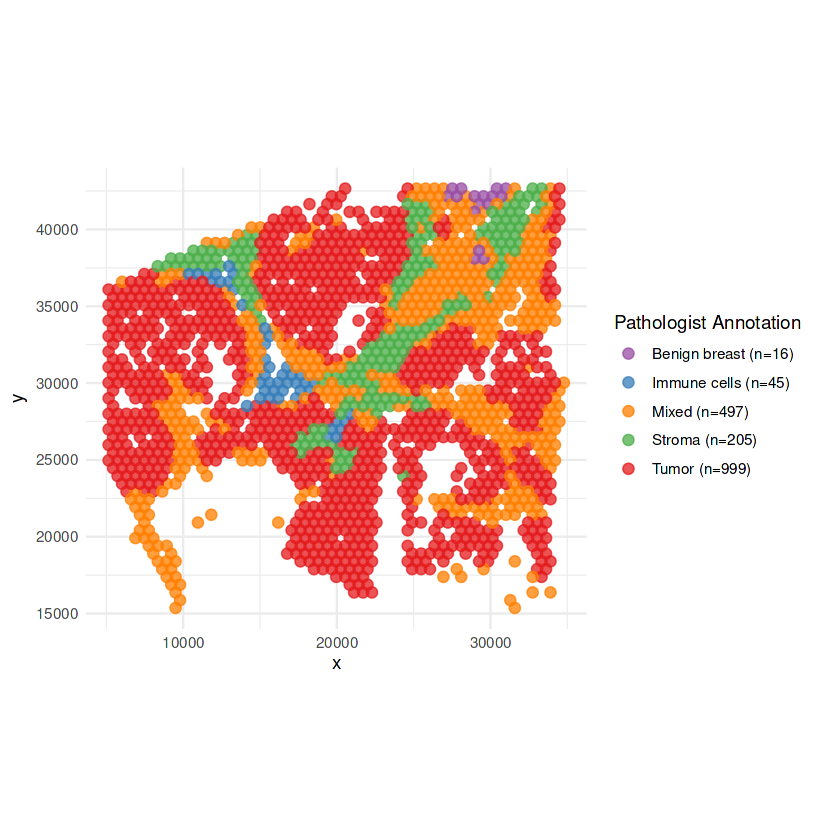

In [48]:
# RE-create df_plot
df_plot <- data.frame(
  x = spatialRNA@coords$x,
  y = spatialRNA@coords$y,
  annotation = pathologist_annos
)

# Determine color palette
ann_colors <- c(
  "Tumor" = "#E41A1C",
  "Immune cells" = "#377EB8",
  "Stroma" = "#4DAF4A",
  "Benign breast" = "#984EA3",
  "Mixed" = "#FF7F00",
  "Unlabeled" = "gray80"

)

# Plot (with labels)
ggplot(df_plot, aes(x = x, y = y, color = annotation)) +
  geom_point(size = 2.5, alpha = 0.75) +
  scale_color_manual(values = ann_colors, labels = ann_labels) +
  coord_fixed() +
  theme_minimal() +
  labs(color = "Pathologist Annotation")


In [49]:
head(myRCTD@results$weights[, 1:5])


6 x 5 sparse Matrix of class "dgCMatrix"
                                     B-cells       CAFs Cancer Epithelial
V10F03.034_C_AAACACCAATAACTGC.1 2.035517e-04 0.02055537         0.3947348
V10F03.034_C_AAACAGCTTTCAGAAG.1 6.981823e-05 0.02161259         0.9202721
V10F03.034_C_AAACAGGGTCTATATT.1 1.424862e-04 0.17240760         0.5062041
V10F03.034_C_AAACAGTGTTCCTGGG.1 6.981823e-05 0.04893943         0.8206440
V10F03.034_C_AAACATGGTGAGAGGA.1 1.424862e-04 0.04049120         0.6107738
V10F03.034_C_AAACATTTCCCGGATT.1 3.233702e-02 0.24561152         0.2058872
                                 Endothelial      Myeloid
V10F03.034_C_AAACACCAATAACTGC.1 0.1376435351 2.861544e-02
V10F03.034_C_AAACAGCTTTCAGAAG.1 0.0397502971 6.981823e-05
V10F03.034_C_AAACAGGGTCTATATT.1 0.0001424862 8.373051e-03
V10F03.034_C_AAACAGTGTTCCTGGG.1 0.0075825634 3.341021e-02
V10F03.034_C_AAACATGGTGAGAGGA.1 0.0801181317 4.477508e-02
V10F03.034_C_AAACATTTCCCGGATT.1 0.1346621644 9.237441e-02

In [50]:
proportion_matrix <- myRCTD@results$weights  # sparse matrix (dgCMatrix)

# coords: data.frame (x, y) spatial spot coordinates, rownames = spot names
# weights: myRCTD@results$weights, row = spot, column = cell type, value = abundance

coords <- coords  # Here spatial coordinates, row names must be the same as weights

# Convert sparse matrix to dense matrix
weights_dense <- as.matrix(weights)

# Combine weights and coords (before melt)
df <- data.frame(coords, weights_dense)
df$spot <- rownames(df)

for (cell_type in colnames(proportion_matrix)) {
  coords[, paste0("Assign ", cell_type, "?")] <- proportion_matrix[, cell_type] >= 0.1
}

# Find the Assign columns
assign_cols <- grep("^Assign .*\\?$", colnames(coords), value = TRUE)

# Extract cell type names (Assign X? → X)
cell_types <- gsub("^Assign |\\?$", "", assign_cols)

# Function: Get the top 3 cell types with the highest probability (but past the threshold) for each row
top_3_assignments <- apply(coords, 1, function(row) {
  # Find assign columns that are TRUE
  true_cols <- assign_cols[as.logical(row[assign_cols])]
  
  if (length(true_cols) == 0) return(NA_character_)
  
  # Extract cell type names
  types <- gsub("^Assign |\\?$", "", true_cols)
  
  # Get the weight values of these cell types from proportion_matrix
  spot_id <- rownames(coords)[which.max(row == row)]  # active spot ID
  weight_vals <- proportion_matrix[spot_id, types]
  
  # Take the top 3, then sort alphabetically
  top3 <- head(names(sort(weight_vals, decreasing = TRUE)), 3)
  top3_sorted <- sort(top3)
  
  paste(top3_sorted, collapse = ", ")
})

# Add the result to coords
coords$Assigned_Cell_Types <- top_3_assignments


In [51]:
table(coords$Assigned_Cell_Types, useNA = "ifany")



                                                   
                                               357 
                  B-cells, CAFs, Cancer Epithelial 
                                                26 
                        B-cells, CAFs, Endothelial 
                                                 2 
                        B-cells, Cancer Epithelial 
                                                 8 
           B-cells, Cancer Epithelial, Endothelial 
                                                 1 
     B-cells, Cancer Epithelial, Normal Epithelial 
                                                 6 
          B-cells, Cancer Epithelial, Plasmablasts 
                                                 1 
                        B-cells, Normal Epithelial 
                                                 1 
                           CAFs, Cancer Epithelial 
                                               325 
              CAFs, Cancer Epithelial, Endothelial 
           

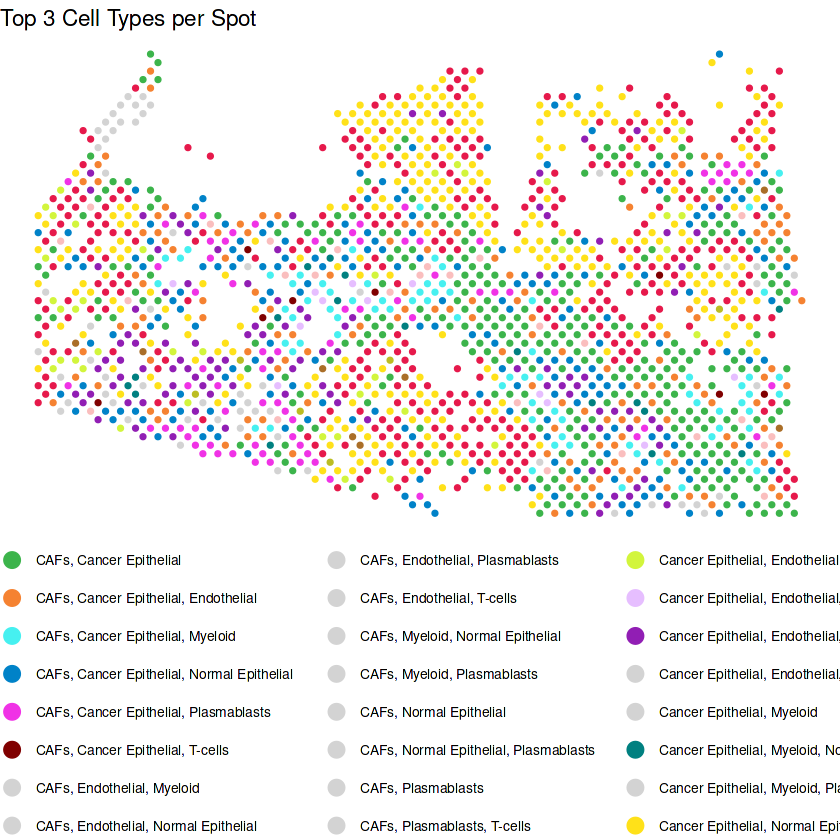

In [52]:
library(ggplot2)

# Palette definition
custom_palette <- c(
  "#e6194b", "#3cb44b", "#ffe119", "#0082c8", "#f58231", "#911eb4", "#46f0f0",
  "#f032e6", "#d2f53c", "#fabebe", "#008080", "#e6beff", "#aa6e28", "#800000", "#bcbd22"
)

# Cut the palette according to the number of unique cell types
assigned_types <- unique(na.omit(coords$Assigned_Cell_Types))

coords$Assigned_Cell_Types <- as.character(coords$Assigned_Cell_Types)
coords$Assigned_Cell_Types[is.na(coords$Assigned_Cell_Types)] <- "Unknown"
coords$Assigned_Cell_Types <- factor(coords$Assigned_Cell_Types)


type_counts <- sort(table(coords$Assigned_Cell_Types), decreasing = TRUE)
assigned_types <- names(type_counts)

# New color palette (red at the top, Unknown at the bottom)
palette_use <- setNames(custom_palette[seq_along(assigned_types)], assigned_types)


# Plot
ggplot(coords, aes(x = x, y = y, color = Assigned_Cell_Types)) +
  geom_point(size = 1) +
  scale_color_manual(values = palette_use, na.value = "lightgrey") +
  scale_y_reverse() +  # In spatial data, the y-axis is inverted.
  theme_void() +
  theme(
    legend.position = "bottom",
    legend.title = element_text(size = 10),
    legend.text = element_text(size = 8)
  ) +
  guides(color = guide_legend(override.aes = list(size = 4))) +
  ggtitle("Top 3 Cell Types per Spot")

options(repr.plot.width = 16, repr.plot.height = 10)





In [53]:
print(palette_use)

                                                   
                                         "#e6194b" 
                           CAFs, Cancer Epithelial 
                                         "#3cb44b" 
              Cancer Epithelial, Normal Epithelial 
                                         "#ffe119" 
        CAFs, Cancer Epithelial, Normal Epithelial 
                                         "#0082c8" 
              CAFs, Cancer Epithelial, Endothelial 
                                         "#f58231" 
 Cancer Epithelial, Endothelial, Normal Epithelial 
                                         "#911eb4" 
                  CAFs, Cancer Epithelial, Myeloid 
                                         "#46f0f0" 
             CAFs, Cancer Epithelial, Plasmablasts 
                                         "#f032e6" 
                    Cancer Epithelial, Endothelial 
                                         "#d2f53c" 
                  B-cells, CAFs, Cancer Epithelial 
            

### Get rid of the multiple assignment problem (selecting dominant cell type idea)

The above cell shows that some portion of the spots have multiple cell types assigned to them, because multiple cell types have values above the threshold. However, in order to compare the assignment results to the ground truth of pathologist annotation for the assessment of the success of the model, the spots with multiple assignments needs to be dealt with. For this purpose, the followings cells check the different combinations of cell types, and assigns the maximum 3 cell types with the highest estimation values (among those above the threshold). After that selection, the dominant cell type is selected as follows:

For combinations of two cell types, the one with percentage 60% or above of the total of the top 2 is the dominant one.

For combinations of three cell type, the one with percentage 40 (or 45)% or above of the total of the top 3 is the dominant one.

If a spot has multiple assignments but there is no dominant cell type according to above thresholds, no assignment is done.

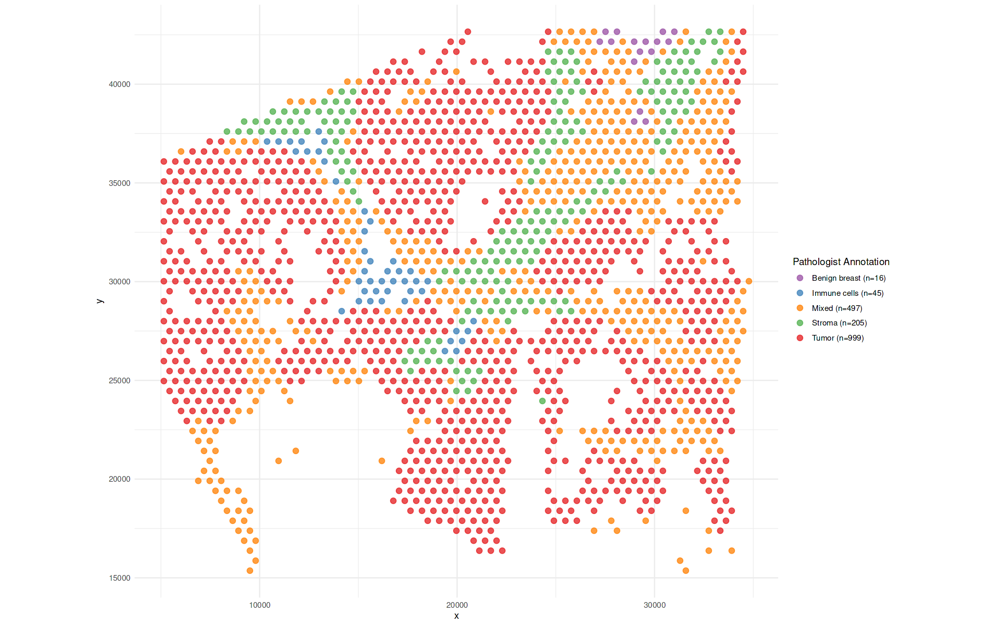

In [54]:
# RE-create df_plot
df_plot <- data.frame(
  x = spatialRNA@coords$x,
  y = spatialRNA@coords$y,
  annotation = pathologist_annos
)

# Determine color palette
ann_colors <- c(
  "Tumor" = "#E41A1C",
  "Immune cells" = "#377EB8",
  "Stroma" = "#4DAF4A",
  "Benign breast" = "#984EA3",
  "Mixed" = "#FF7F00",
  "Unlabeled" = "gray80"

)

# Plot (with labels)
ggplot(df_plot, aes(x = x, y = y, color = annotation)) +
  geom_point(size = 2.5, alpha = 0.75) +
  scale_color_manual(values = ann_colors, labels = ann_labels) +
  coord_fixed() +
  theme_minimal() +
  labs(color = "Pathologist Annotation")

In [55]:
# Find the required assignment columns
assign_cols <- grep("^Assign .*\\?$", colnames(coords), value = TRUE)

# Identify cell types
cell_types <- gsub("^Assign |\\?$", "", assign_cols)

# Dominant cell type selection function
get_dominant_cell_type <- function(row, spot_id) {
  assigned <- assign_cols[which(as.logical(row[assign_cols]))]
  if (length(assigned) == 0) return("No Assignment")
  
  types <- gsub("^Assign |\\?$", "", assigned)
  weights <- proportion_matrix[spot_id, types]
  weights <- weights[order(weights, decreasing = TRUE)]
  
  top_types <- names(weights)[1:min(3, length(weights))]
  top_vals <- as.numeric(weights[1:min(3, length(weights))])
  
  total <- sum(top_vals)
  
  if (length(top_types) == 1) {
    return(top_types[1])
  } else if (length(top_types) == 2) {
    if (top_vals[1] >= 0.6 * total) {
      return(top_types[1])
    } else {
      return("No Assignment")
    }
  } else if (length(top_types) == 3) {
    if (top_vals[1] >= 0.4 * total) {
      return(top_types[1])
    } else {
      return("No Assignment")
    }
  }
}

# Calculate per spot
dominant_types <- mapply(function(i, spot_id) {
  get_dominant_cell_type(coords[i, ], spot_id)
}, seq_len(nrow(coords)), rownames(coords))

# Add the dominant cell type
coords$Assigned_Dominant_Cell_Type <- dominant_types


In [56]:
# Make the type a character (to ensure the effect of the previous codes)
coords$Assigned_Dominant_Cell_Type <- as.character(coords$Assigned_Dominant_Cell_Type)

# Replace both NA and "NULL" with "No Assignment"
coords$Assigned_Dominant_Cell_Type[is.na(coords$Assigned_Dominant_Cell_Type) | 
                                   coords$Assigned_Dominant_Cell_Type == "NULL"] <- "No Assignment"

# Also fix any missing spaces
coords$Assigned_Dominant_Cell_Type <- trimws(coords$Assigned_Dominant_Cell_Type)


In [57]:
dominant_types <- unique(coords$Assigned_Dominant_Cell_Type)

# Set to autocomplete if number of colors is insufficient
palette_colors <- c(
  "#e6194b", "#3cb44b", "#ffe119", "#0082c8", "#f58231",
  "#911eb4", "#46f0f0", "#f032e6", "#d2f53c", "#fabebe",
  "#008080", "#e6beff", "#aa6e28", "#800000", "#bcbd22"
)
while (length(palette_colors) < length(dominant_types)) {
  palette_colors <- c(palette_colors, sample(colors(), length(dominant_types) - length(palette_colors)))
}

dominant_palette <- setNames(palette_colors[1:length(dominant_types)], dominant_types)


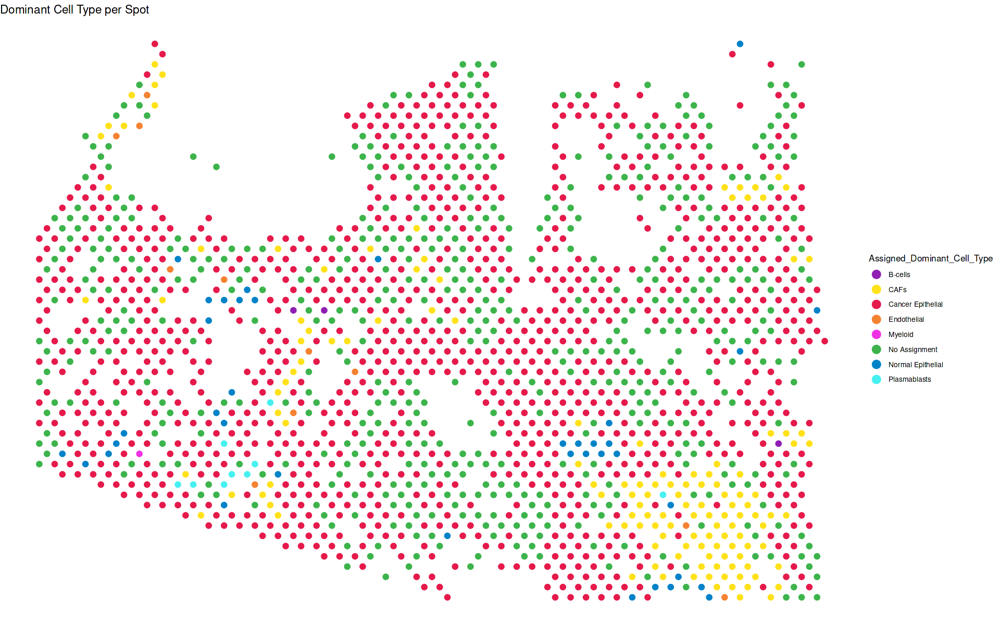

In [58]:
ggplot(coords, aes(x = x, y = y, color = Assigned_Dominant_Cell_Type)) +
  geom_point(size = 2.5) +
  scale_color_manual(values = dominant_palette) +
  scale_y_reverse() +
  theme_void() +
  theme(
    legend.position = "right",
    legend.title = element_text(size = 10),
    legend.text = element_text(size = 8)
  ) +
  guides(color = guide_legend(override.aes = list(size = 4))) +
  ggtitle("Dominant Cell Type per Spot")



## Calculate TP, FP, FN, TN for each assignment

In order to calculate metrices (like F1 score, accuracy, precision etc.), the counts of True Positive (TP), False Positive (FP), False Negative (FN), True Negative (TN) data points need to be calculated for each pathologist annotation. Since the model can not assign an annotation to each data point (noted as 'No Assignment' in 'Assigned Cell Type' column), and the cell type to pathologist annotation mapping is not mutually exclusive for some annotations, the built-in Python packages is not used directly. Instead, each score is calculated manually for each pathologist annotation as follows:

True Positive (TP): If a spot is predicted as a cell type that maps to the annotation of interest, and it matches the true annotation; and it is not left with "No Assignment".


False Positive (FP): If a spot is predicted as a cell type that maps to the annotation of interest, but it does not match the true annotation; and it is not left with "No Assignment".


False Negative (FN): If a spot is predicted as a cell type that does not map to the annotation of interest or it is left with "No Assignment", but the true annotation is the annotation of interest.


True Negative (TN): If a spot is predicted as a cell type that does not map to the annotation of interest or it is left with "No Assignment", and the true annotation is not the annotation of interest.

In [59]:
# Cell rates (RCTD output)
weights_dense <- as.matrix(myRCTD@results$weights)

# The cell type with the highest ratio for each spot
Assigned_Cell_Type <- colnames(weights_dense)[apply(weights_dense, 1, which.max)]


In [60]:
# Spot names
spot_ids <- rownames(weights_dense)

# df: merge all data
df <- data.frame(
  spot_id = spot_ids,
  x = coords$x,
  y = coords$y,
  Assigned_Cell_Type = Assigned_Cell_Type,
  Pathologist_annotations = pathologist_annos,
  stringsAsFactors = FALSE
)


In [61]:
mapping <- list(
  "Cancer Epithelial" = "Tumor",
  "Benign Epithelial" = "Benign breast",
  "T cells" = "Immune cells",
  "B cells" = "Immune cells",
  "Stromal cells" = "Stroma"
)


In [62]:
annotations <- c("Tumor", "Benign breast", "Immune cells", "Stroma")
scores <- lapply(annotations, function(x) list(TP=0, FP=0, FN=0, TN=0))
names(scores) <- annotations

map_to_annotation <- function(cell_type) {
  if (is.null(cell_type) || cell_type == "No Assignment") return(NA)
  val <- mapping[[cell_type]]
  if (is.null(val)) return(NA)
  return(val)
}

# starting the cycle
for (i in 1:nrow(df)) {
  true_annot <- df$Pathologist_annotations[i]
  pred_cell <- df$Assigned_Cell_Type[i]
  mapped_pred_annot <- map_to_annotation(pred_cell)

  for (annot in annotations) {
    if (is.na(mapped_pred_annot)) {
      if (true_annot == annot) {
        scores[[annot]]$FN <- scores[[annot]]$FN + 1
      } else {
        scores[[annot]]$TN <- scores[[annot]]$TN + 1
      }
    } else if (mapped_pred_annot == annot) {
      if (true_annot == annot) {
        scores[[annot]]$TP <- scores[[annot]]$TP + 1
      } else {
        scores[[annot]]$FP <- scores[[annot]]$FP + 1
      }
    } else {
      if (true_annot == annot) {
        scores[[annot]]$FN <- scores[[annot]]$FN + 1
      } else {
        scores[[annot]]$TN <- scores[[annot]]$TN + 1
      }
    }
  }
}


In [63]:
metrics <- data.frame()

for (annot in annotations) {
  TP <- scores[[annot]]$TP
  FP <- scores[[annot]]$FP
  FN <- scores[[annot]]$FN
  TN <- scores[[annot]]$TN
  
  accuracy <- (TP + TN) / (TP + FP + FN + TN)
  precision <- if ((TP + FP) == 0) NA else TP / (TP + FP)
  recall <- if ((TP + FN) == 0) NA else TP / (TP + FN)
  specificity <- if ((TN + FP) == 0) NA else TN / (TN + FP)
  f1 <- if (is.na(precision) || is.na(recall) || (precision + recall) == 0) NA else 2 * (precision * recall) / (precision + recall)
  fpr <- if ((FP + TN) == 0) NA else FP / (FP + TN)
  fnr <- if ((FN + TP) == 0) NA else FN / (FN + TP)
  npv <- if ((TN + FN) == 0) NA else TN / (TN + FN)
  
  metrics <- rbind(metrics, data.frame(
    Category = annot,
    Accuracy = accuracy,
    Precision = precision,
    Recall = recall,
    Specificity = specificity,
    F1_Score = f1,
    FPR = fpr,
    FNR = fnr,
    NPV = npv
  ))
}



Attaching package: ‘tidyr’


The following object is masked from ‘package:reshape2’:

    smiths


The following object is masked from ‘package:S4Vectors’:

    expand


The following objects are masked from ‘package:Matrix’:

    expand, pack, unpack


Warning message:
“Removed 6 rows containing missing values or values outside the scale range
(`geom_bar()`).”


Category,Metric,Value
<chr>,<chr>,<dbl>
Tumor,Accuracy,0.67707151
Tumor,Precision,0.64410188
Tumor,Recall,0.96196196
Tumor,Specificity,0.30406291
Tumor,F1_Score,0.77157768
Tumor,FPR,0.69593709
Tumor,FNR,0.03803804
Tumor,NPV,0.85925926
Benign breast,Accuracy,0.99091941


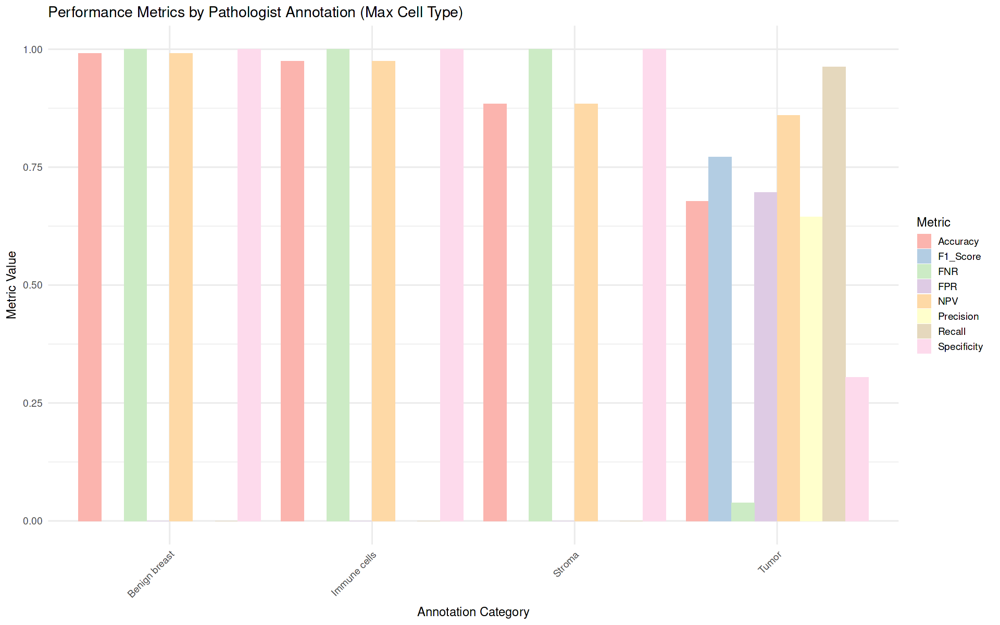

In [64]:
library(tidyr)
library(ggplot2)

metrics_long <- pivot_longer(metrics, cols = -Category, names_to = "Metric", values_to = "Value")

ggplot(metrics_long, aes(x = Category, y = Value, fill = Metric)) +
  geom_bar(stat = "identity", position = "dodge") +
  theme_minimal(base_size = 14) +
  labs(title = "Performance Metrics by Pathologist Annotation (Max Cell Type)",
       x = "Annotation Category", y = "Metric Value") +
  scale_fill_brewer(palette = "Pastel1") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))

metrics_long

write.csv(metrics_long, "rctd_metrics.csv", row.names = FALSE)

In [65]:
table(df$Assigned_Cell_Type)


          B-cells              CAFs Cancer Epithelial       Endothelial 
                4               176              1492                15 
          Myeloid Normal Epithelial      Plasmablasts 
                3                49                23 

In [66]:
table(df$Pathologist_annotations)


Benign breast  Immune cells         Mixed        Stroma         Tumor 
           16            45           497           205           999 

In [67]:
table(Predicted = df$Assigned_Cell_Type, Actual = df$Pathologist_annotations)
table(df$Assigned_Cell_Type)
table(df$Pathologist_annotations)
wrong_preds <- df[df$Assigned_Cell_Type != df$Pathologist_annotations, ]
head(wrong_preds)


                   Actual
Predicted           Benign breast Immune cells Mixed Stroma Tumor
  B-cells                       0            0     2      0     2
  CAFs                          3            9   100     54    10
  Cancer Epithelial             5           25   359    142   961
  Endothelial                   2            3     9      0     1
  Myeloid                       0            1     1      0     1
  Normal Epithelial             6            0    15      6    22
  Plasmablasts                  0            7    11      3     2


          B-cells              CAFs Cancer Epithelial       Endothelial 
                4               176              1492                15 
          Myeloid Normal Epithelial      Plasmablasts 
                3                49                23 


Benign breast  Immune cells         Mixed        Stroma         Tumor 
           16            45           497           205           999 

,spot_id,x,y,Assigned_Cell_Type,Pathologist_annotations
,<chr>,<int>,<int>,<chr>,<chr>
1,V10F03.034_C_AAACACCAATAACTGC.1,10669,33559,Cancer Epithelial,Tumor
2,V10F03.034_C_AAACAGCTTTCAGAAG.1,7764,25472,Cancer Epithelial,Tumor
3,V10F03.034_C_AAACAGGGTCTATATT.1,8926,27494,Cancer Epithelial,Mixed
4,V10F03.034_C_AAACAGTGTTCCTGGG.1,17640,40636,Cancer Epithelial,Tumor
5,V10F03.034_C_AAACATGGTGAGAGGA.1,5150,35075,Cancer Epithelial,Tumor
6,V10F03.034_C_AAACATTTCCCGGATT.1,33327,34571,CAFs,Mixed


###  Strict Maximum

In [68]:
# weights_dense: spot x cell_type matrix

# weights_dense <- as.matrix(myRCTD@results$weights)

Assigned_Cell_Type <- apply(weights_dense, 1, function(x) {
  if(all(x == 0)) return("No Assignment")
  colnames(weights_dense)[which.max(x)]
})
df$Assigned_Cell_Type <- Assigned_Cell_Type


### Top-2 Assignment

In [69]:
top2_assignment <- apply(weights_dense, 1, function(x) {
  if(all(x == 0)) return("No Assignment")
  
  sorted_idx <- order(x, decreasing = TRUE)
  max1 <- x[sorted_idx[1]]
  max2 <- x[sorted_idx[2]]
  
  cell1 <- colnames(weights_dense)[sorted_idx[1]]
  cell2 <- colnames(weights_dense)[sorted_idx[2]]
  
# Set your margin 
  if (max2 / max1 >= 0.4) {
    return(paste(cell1, cell2, sep = "/"))
  } else {
    return(cell1)
  }
})

df$Top2_Assigned_Cell_Type <- top2_assignment


In [70]:
annotations <- c("Tumor", "Benign breast", "Immune cells", "Stroma")
scores_max <- lapply(annotations, function(x) list(TP=0, FP=0, FN=0, TN=0))
scores_top2 <- lapply(annotations, function(x) list(TP=0, FP=0, FN=0, TN=0))
names(scores_max) <- annotations
names(scores_top2) <- annotations

map_to_annotation <- function(cell_type) {
  if (is.null(cell_type) || cell_type == "No Assignment") return(NA)
  val <- mapping[[cell_type]]
  if (is.null(val)) return(NA)
  return(val)
}

# Calculate for maximum assignment
for (i in 1:nrow(df)) {
  true_annot <- df$Pathologist_annotations[i]
  pred_cell <- df$Assigned_Cell_Type[i]
  mapped_pred_annot <- map_to_annotation(pred_cell)

  for (annot in annotations) {
    if (is.na(mapped_pred_annot)) {
      if (true_annot == annot) {
        scores_max[[annot]]$FN <- scores_max[[annot]]$FN + 1
      } else {
        scores_max[[annot]]$TN <- scores_max[[annot]]$TN + 1
      }
    } else if (mapped_pred_annot == annot) {
      if (true_annot == annot) {
        scores_max[[annot]]$TP <- scores_max[[annot]]$TP + 1
      } else {
        scores_max[[annot]]$FP <- scores_max[[annot]]$FP + 1
      }
    } else {
      if (true_annot == annot) {
        scores_max[[annot]]$FN <- scores_max[[annot]]$FN + 1
      } else {
        scores_max[[annot]]$TN <- scores_max[[annot]]$TN + 1
      }
    }
  }
}

# Calculate for Top-2 assignment
for (i in 1:nrow(df)) {
  true_annot <- df$Pathologist_annotations[i]
  pred_cells <- unlist(strsplit(df$Top2_Assigned_Cell_Type[i], "/"))
  mapped_pred_annots <- unique(unlist(lapply(pred_cells, map_to_annotation)))

  for (annot in annotations) {
    if (all(is.na(mapped_pred_annots))) {
      if (true_annot == annot) {
        scores_top2[[annot]]$FN <- scores_top2[[annot]]$FN + 1
      } else {
        scores_top2[[annot]]$TN <- scores_top2[[annot]]$TN + 1
      }
    } else if (annot %in% mapped_pred_annots) {
      if (true_annot == annot) {
        scores_top2[[annot]]$TP <- scores_top2[[annot]]$TP + 1
      } else {
        scores_top2[[annot]]$FP <- scores_top2[[annot]]$FP + 1
      }
    } else {
      if (true_annot == annot) {
        scores_top2[[annot]]$FN <- scores_top2[[annot]]$FN + 1
      } else {
        scores_top2[[annot]]$TN <- scores_top2[[annot]]$TN + 1
      }
    }
  }
}


In [71]:
# function: create data.frame from scores list
scores_to_df <- function(scores_list, method_name) {
  do.call(rbind, lapply(names(scores_list), function(annot) {
    data.frame(
      Annotation = annot,
      Method = method_name,
      TP = scores_list[[annot]]$TP,
      FP = scores_list[[annot]]$FP,
      FN = scores_list[[annot]]$FN,
      TN = scores_list[[annot]]$TN
    )
  }))
}

df_max <- scores_to_df(scores_max, "Maximum")
df_top2 <- scores_to_df(scores_top2, "Top-2")

# Combine two methods
metrics_df <- rbind(df_max, df_top2)

# Calculate Sensitivity (Recall) and Precision
metrics_df$Recall <- with(metrics_df, TP / (TP + FN))
metrics_df$Precision <- with(metrics_df, TP / (TP + FP))


Warning message:
“Removed 6 rows containing missing values or values outside the scale range
(`geom_bar()`).”


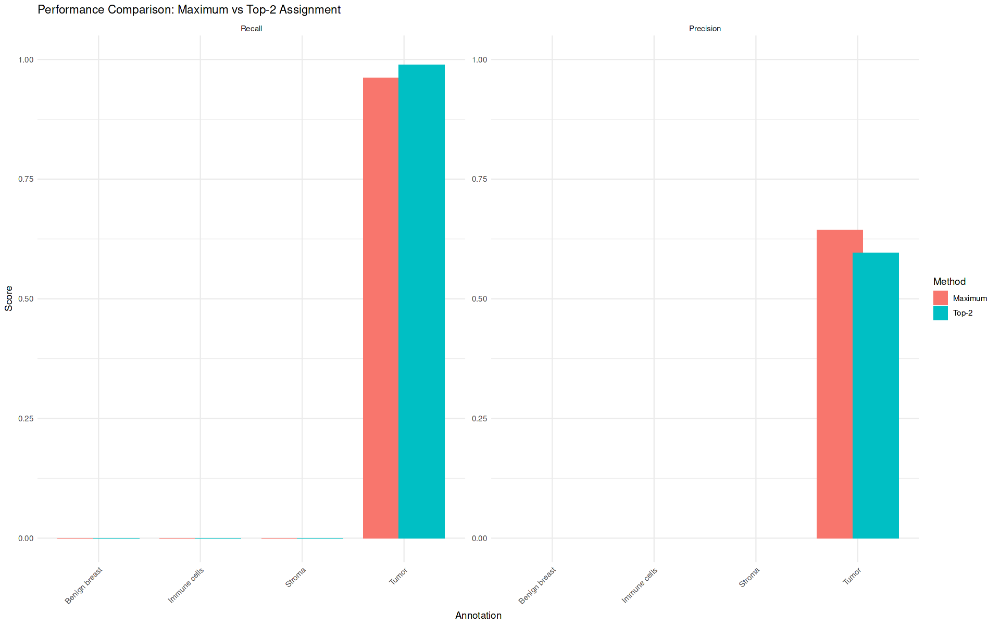

In [72]:
library(ggplot2)
library(reshape2)

# Data is melted and converted to long format
metrics_long <- melt(metrics_df, id.vars = c("Annotation", "Method"), measure.vars = c("Recall", "Precision"))

# Plot
ggplot(metrics_long, aes(x = Annotation, y = value, fill = Method)) +
  geom_bar(stat = "identity", position = position_dodge(width = 0.7)) +
  facet_wrap(~variable, scales = "free_y") +
  ylim(0,1) +
  labs(title = "Performance Comparison: Maximum vs Top-2 Assignment",
       y = "Score",
       x = "Annotation") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))


## Performance Analysis Based on Maximum Cell Type Assignment

In the initial phase of our analysis, we utilized the **maximum cell type assignment** approach to predict the cell type for each spatial spot. This method selects the cell type with the highest predicted abundance or weight for each spot.


- The performance metrics, including accuracy, precision, recall, and F1-score, were **remarkably high**, especially for the **Tumor** category.
- This high performance suggests that the model is quite effective in identifying the dominant tumor cells in the dataset.
- Other categories such as Benign breast, Immune cells, and Stroma showed relatively lower scores, but still maintained some predictive value.
- Overall, the max assignment approach demonstrated a strong ability to correctly classify the most abundant cell types in the spatial transcriptomics data.

This initial success validates that selecting the cell type with the highest assignment probability can be a robust and straightforward method for spatial cell type annotation.

---

## Exploring Alternative Models and Limitations on Sparse Data

After confirming the effectiveness of the maximum cell type assignment method, we explored **alternative models and assignment strategies** to further improve the classification performance.

### Findings from Alternative Models:
- When incorporating models that allow multiple cell type assignments or use probabilistic thresholds, the results became more nuanced but did not significantly outperform the max assignment method.
- The complexity of the spatial transcriptomics data and overlapping expression profiles between cell types make precise classification challenging.

### Important Considerations:
- The **model tends to generalize heavily when working with low-abundance or sparse cell type data**.
- Sparse data points, or spots with ambiguous signals, often lead to misclassification or “No Assignment” outcomes.
- This generalization suggests that while the model captures dominant cell types well, it struggles with less represented or mixed cell populations.
- Improving the model's specificity might require more balanced reference data, refined mapping strategies, or integration of additional biological information.


### Saving results

In [73]:
library(Matrix)  # for sparse matrix operations

# Convert weights sparse matrix to density matrix
weights_dense <- as.matrix(myRCTD@results$weights)

# Combine with coordinates if you want
coords_df <- data.frame(
  x = coords$x,
  y = coords$y,
  spot = rownames(coords)
)

# Convert Weights to dataframe (rows: spot, columns: cell type)
weights_df <- data.frame(spot = rownames(weights_dense), weights_dense)

# merge with coordinates.
final_df <- merge(coords_df, weights_df, by.x = "spot", by.y = "spot")

# save as SV
write.csv(final_df, "rctd_weights.csv", row.names = FALSE)

# you assigned a dominant cell type (e.g. max cell type per spot)
dominant_cell_type <- apply(weights_dense, 1, function(x) colnames(weights_dense)[which.max(x)])

dominant_df <- data.frame(spot = rownames(weights_dense), Assigned_Cell_Type = dominant_cell_type)

write.csv(dominant_df, "rctd_dominant_assignment.csv", row.names = FALSE)

In [74]:
library(tidyverse)
library(Matrix)
library(dplyr)

# RCTD results(sparse matrix)
weights_sparse <- myRCTD@results$weights

# Sparse matrix → dense matrix → data.frame
weights <- as.data.frame(as.matrix(weights_sparse))
weights$spot_id <- rownames(weights)

# Convert long format
long_df <- weights %>%
  pivot_longer(cols = -spot_id, names_to = "cell_type", values_to = "score")

# Select the highest scoring cell type for each spot
rctd_dominant <- long_df %>%
  group_by(spot_id) %>%
  slice_max(order_by = score, n = 1) %>%
  ungroup() %>%
  mutate(
    rctd_prediction = cell_type,
    rctd_score = score
  ) %>%
dplyr::select(spot_id, rctd_prediction, rctd_score)

# Save as csv
write.csv(rctd_dominant, "rctd_predictions.csv", row.names = FALSE)


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ lubridate 1.9.4     ✔ tibble    3.3.0
✔ purrr     1.1.0     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ lubridate::%within%() masks IRanges::%within%()
✖ dplyr::collapse()     masks IRanges::collapse()
✖ dplyr::combine()      masks Biobase::combine(), BiocGenerics::combine()
✖ dplyr::desc()         masks IRanges::desc()
✖ tidyr::expand()       masks S4Vectors::expand(), Matrix::expand()
✖ dplyr::filter()       masks stats::filter()
✖ dplyr::first()        masks S4Vectors::first()
✖ dplyr::lag()          masks stats::lag()
✖ tidyr::pack()         masks Matrix::pack()
✖ ggplot2::Position()   masks BiocGenerics::Position(), base::Position()
✖ purrr::reduce()       masks IRanges::reduce()
✖ dplyr::rename()       masks S4Vectors::rename()
✖ lubridate::second()   masks S4Vectors::second()
✖ l